In [2]:
import os
import re
import pandas as pd
import nilearn as nl
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from nilearn.input_data import NiftiMasker
from nilearn.image.image import mean_img
from nilearn import plotting,image
from nilearn.plotting import view_img

import warnings
warnings.filterwarnings("ignore")
from nilearn.image import math_img
import time
import multiprocessing






/opt/anaconda3/lib/python3.8/site-packages/nilearn/input_data/__init__.py:27: FutureWarning: The import path 'nilearn.input_data' is deprecated in version 0.9. Importing from 'nilearn.input_data' will be possible at least until release 0.13.0. Please import from 'nilearn.maskers' instead.
  warnings.warn(message, FutureWarning)


In [3]:
#f_list = [os.path.join(root,f) for root,dirs,files in os.walk(
#    '../derivatives/') for f in files if 
#          (('me1' in f) & (f.endswith('desc-preproc_bold.nii.gz')))|
#         (('me4' in f ) & (f.endswith('desc-optcom-dewarped_bold.nii.gz')))]

f_list = [os.path.join(root,f) for root,dirs,files in os.walk(
   '../derivatives/') for f in files if f.endswith('space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz')]
display(f_list)

['../derivatives/fmriprep/sub-135/func/sub-135_task-trust_run-5_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz',
 '../derivatives/fmriprep/sub-135/func/sub-135_task-sharedreward_run-1_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz',
 '../derivatives/fmriprep/sub-135/func/sub-135_task-trust_run-2_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz',
 '../derivatives/fmriprep/sub-135/func/sub-135_task-trust_run-1_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz',
 '../derivatives/fmriprep/sub-135/func/sub-135_task-trust_run-4_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz',
 '../derivatives/fmriprep/sub-135/func/sub-135_task-sharedreward_run-2_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz',
 '../derivatives/fmriprep/sub-135/func/sub-135_task-ultimatum_run-1_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz',
 '../derivatives/fmriprep/sub-135/func/sub-135_task-trust_run-3_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz',
 '../derivatives/fmriprep/sub-135/func/sub-135

# Making anatomical Masks and getting files


Dataset created in /home/local/TU/tuj71575/nilearn_data/fsl



 ...done. (1 seconds, 0 min)
Extracting data from /home/local/TU/tuj71575/nilearn_data/fsl/8a69ae399b721d54ac7144f836f55c27/HarvardOxford.tgz..... done.


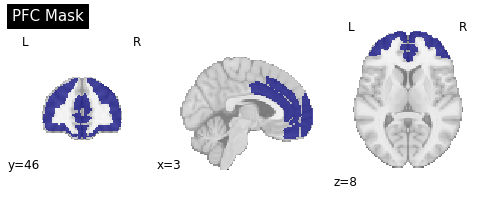

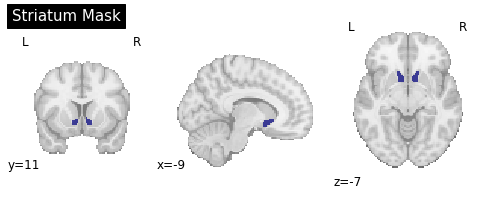

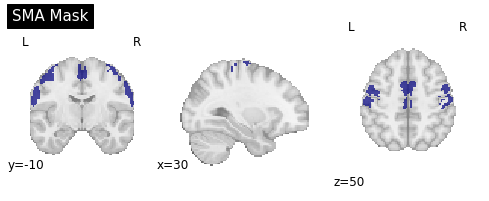

In [4]:
from nilearn import image,datasets,masking,plotting,input_data
#Striatum Mask



HO_sub=datasets.fetch_atlas_harvard_oxford(atlas_name='sub-maxprob-thr25-2mm')

keep = [idx for idx, s in enumerate(HO_sub.labels) if
        'Accumbens' in s]

keepimg_list=[image.math_img("img==%s"%(idx),img=HO_sub.maps) for idx in keep]   

str_regions=image.concat_imgs(np.array(keepimg_list))
str_mask=masking.compute_background_mask(str_regions)
str_mask=NiftiMasker(mask_img=str_mask)

#MPFC mask
HO_cort=datasets.fetch_atlas_harvard_oxford(atlas_name='cort-maxprob-thr50-2mm')
keep = [idx for idx, s in enumerate(HO_cort.labels) if
        'Frontal Medial Cortex'==s or
        'Frontal Pole'==s or
        'Frontal Orbital Cortex'==s or
        'Cingulate Gyrus, anterior division'==s or
        'Paracingulate Gyrus'==s]

keepimg_list=[image.math_img("img==%s"%(idx),img=HO_cort.maps) for idx in keep]                               

cort_regions=image.concat_imgs(np.array(keepimg_list))
cort_mask=masking.compute_background_mask(cort_regions)
cort_mask=NiftiMasker(mask_img=cort_mask)

#SMA mask
HO_cort=datasets.fetch_atlas_harvard_oxford(atlas_name='cort-maxprob-thr50-2mm')
keep = [idx for idx, s in enumerate(HO_cort.labels) if
        'Juxtapositional Lobule Cortex' in s or
        'Precentral Gyrus'==s or
        'Postcentral Gyrus'==s]

keepimg_list=[image.math_img("img==%s"%(idx),img=HO_cort.maps) for idx in keep]                               

SMA_regions=image.concat_imgs(np.array(keepimg_list))
SMA_mask=masking.compute_background_mask(SMA_regions)
SMA_mask=NiftiMasker(mask_img=SMA_mask)

plotting.plot_roi(cort_mask.mask_img,title="PFC Mask", draw_cross=False)
plt.show()
plotting.plot_roi(str_mask.mask_img,title='Striatum Mask',draw_cross=False)
plt.show()
plotting.plot_roi(SMA_mask.mask_img,title='SMA Mask',draw_cross=False)
plt.show()

# TSNR
- Heads up these Graphs are interactive

sub: 135 task: sharedreward run: 1


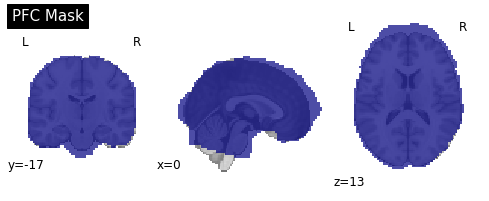

sub: 135 task: sharedreward run: 2


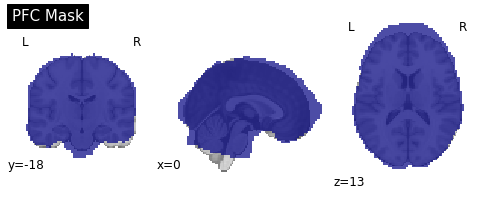

sub: 158 task: sharedreward run: 2


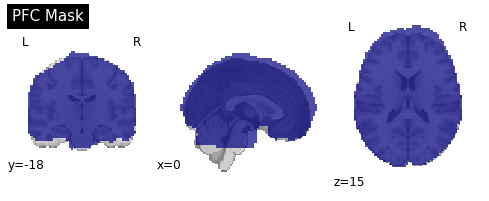

sub: 158 task: sharedreward run: 1


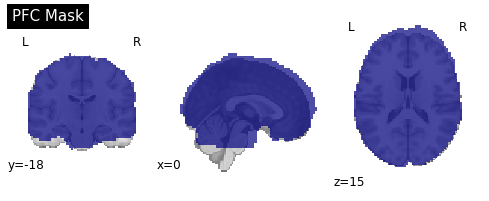

sub: 118 task: sharedreward run: 2


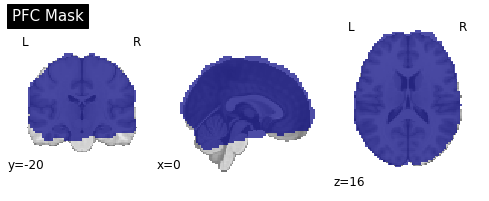

sub: 118 task: sharedreward run: 1


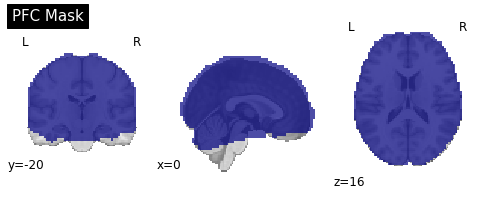

sub: 154 task: sharedreward run: 2


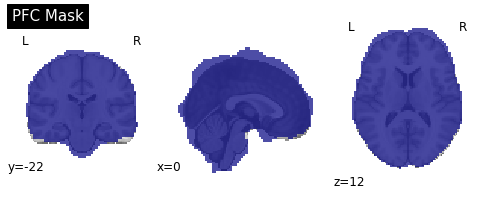

sub: 154 task: sharedreward run: 1


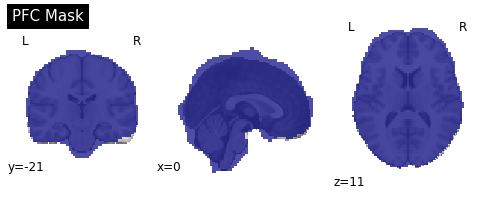

sub: 107 task: sharedreward run: 1


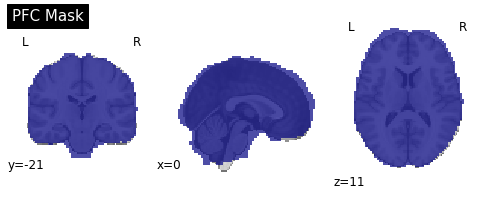

sub: 107 task: sharedreward run: 2


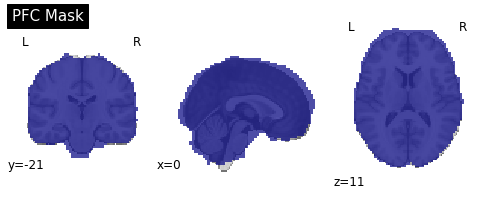

sub: 142 task: sharedreward run: 2


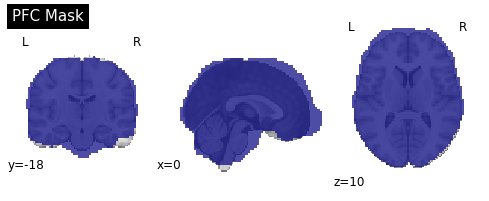

sub: 142 task: sharedreward run: 1


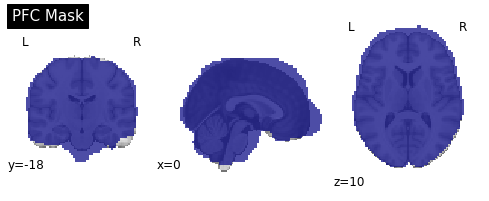

sub: 113 task: sharedreward run: 1


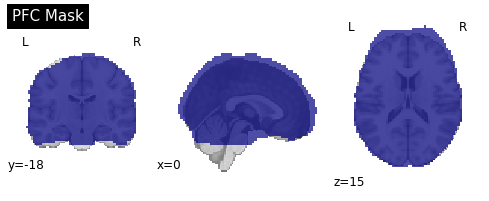

sub: 113 task: sharedreward run: 2


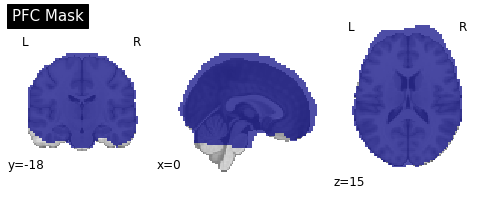

sub: 159 task: sharedreward run: 1


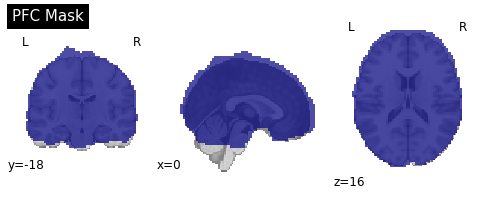

sub: 159 task: sharedreward run: 2


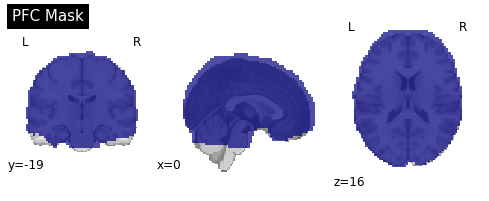

sub: 152 task: sharedreward run: 2


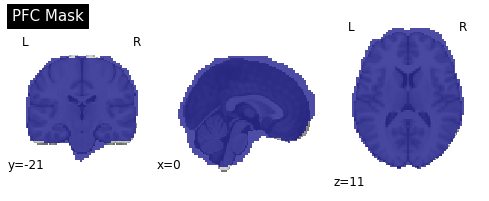

sub: 152 task: sharedreward run: 1


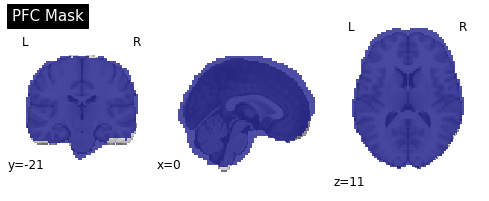

sub: 106 task: sharedreward run: 2


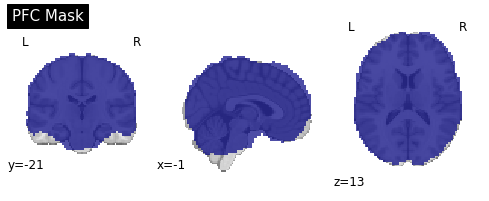

sub: 106 task: sharedreward run: 1


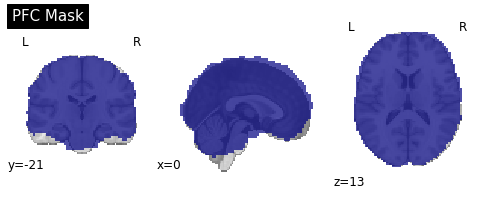

sub: 132 task: sharedreward run: 2


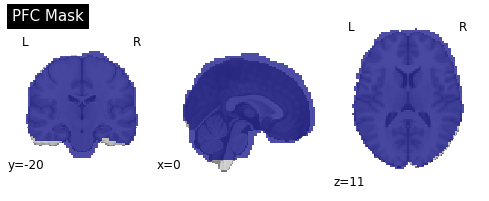

sub: 132 task: sharedreward run: 1


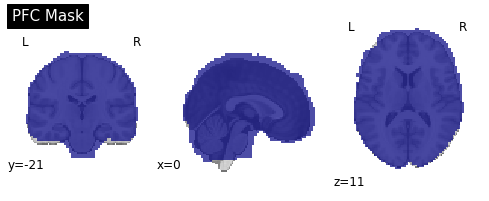

sub: 112 task: sharedreward run: 2


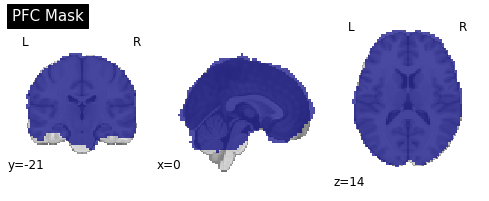

sub: 112 task: sharedreward run: 1


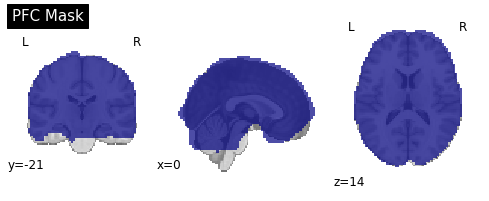

sub: 134 task: sharedreward run: 2


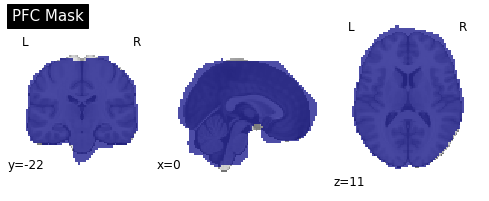

sub: 134 task: sharedreward run: 1


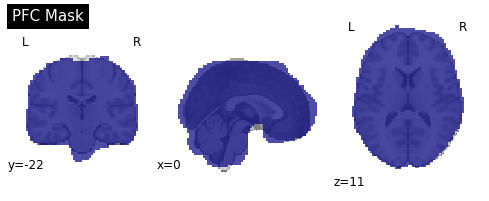

sub: 140 task: sharedreward run: 2


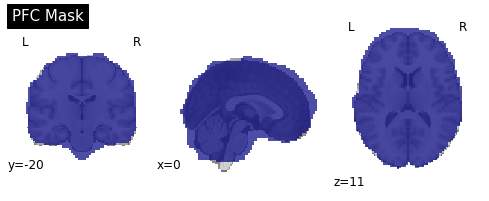

sub: 140 task: sharedreward run: 1


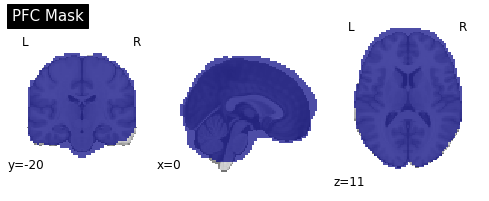

sub: 153 task: sharedreward run: 2


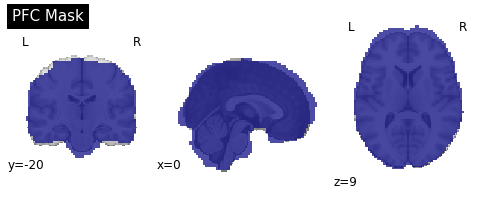

sub: 153 task: sharedreward run: 1


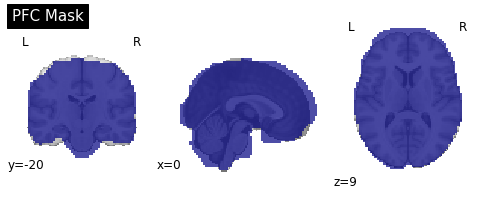

sub: 131 task: sharedreward run: 1


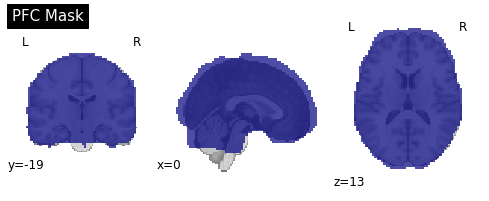

sub: 131 task: sharedreward run: 2


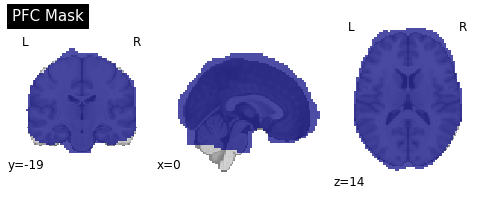

sub: 125 task: sharedreward run: 2


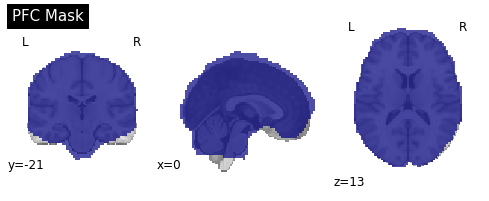

sub: 125 task: sharedreward run: 1


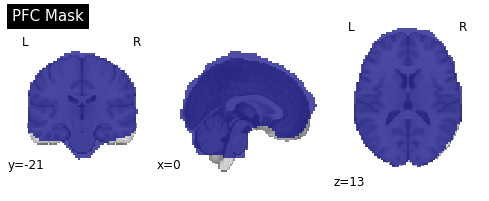

sub: 151 task: sharedreward run: 1


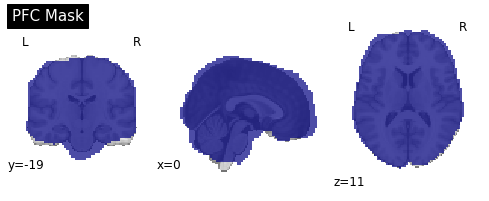

sub: 151 task: sharedreward run: 2


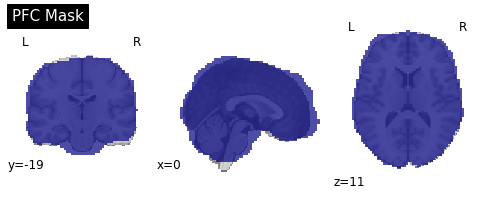

sub: 136 task: sharedreward run: 1


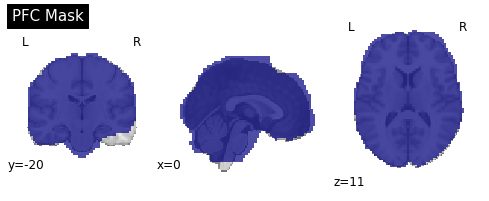

sub: 136 task: sharedreward run: 2


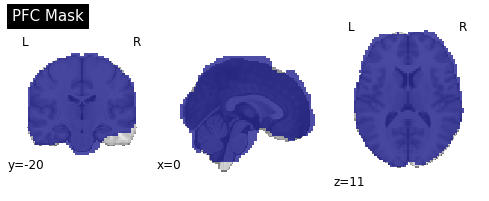

sub: 145 task: sharedreward run: 1


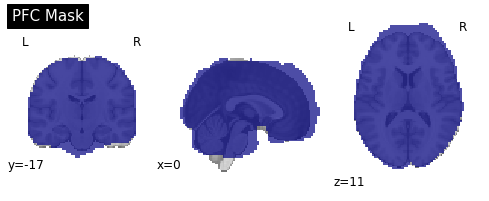

sub: 145 task: sharedreward run: 2


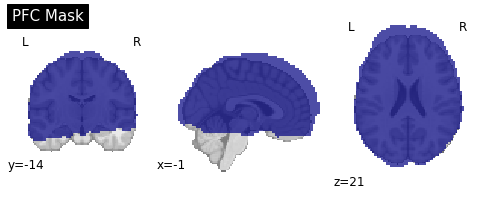

sub: 147 task: sharedreward run: 2


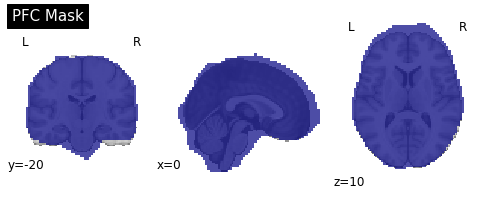

sub: 147 task: sharedreward run: 1


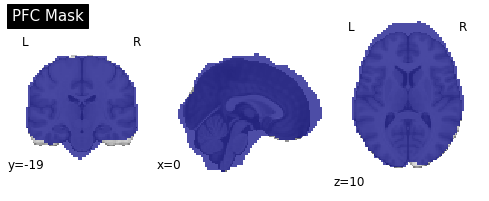

sub: 105 task: sharedreward run: 1


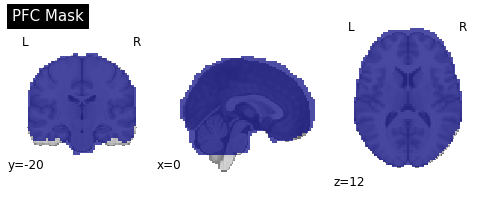

sub: 105 task: sharedreward run: 2


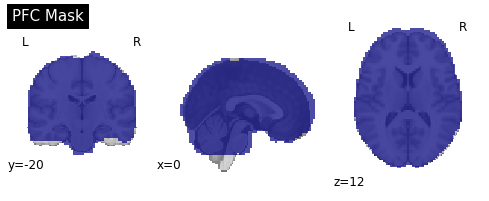

sub: 108 task: sharedreward run: 2


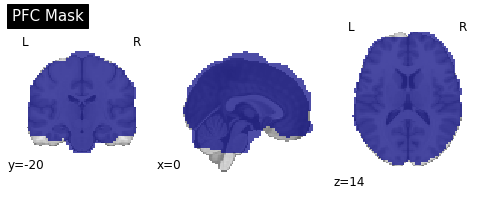

sub: 108 task: sharedreward run: 1


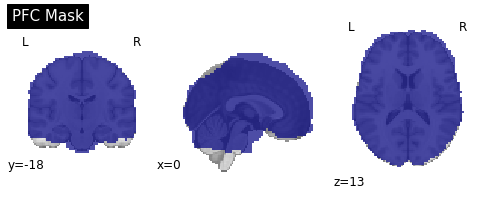

sub: 156 task: sharedreward run: 1


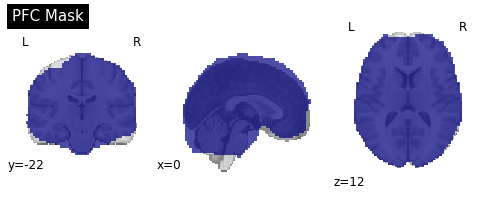

sub: 156 task: sharedreward run: 2


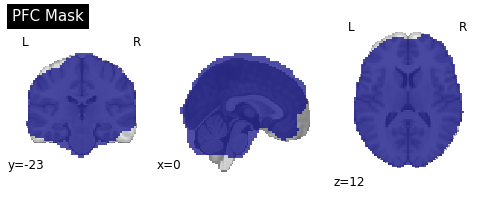

sub: 157 task: sharedreward run: 2


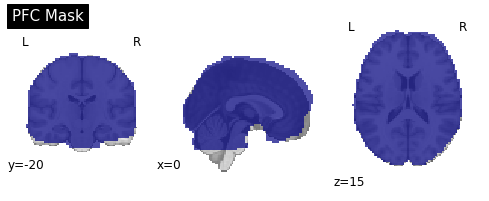

sub: 157 task: sharedreward run: 1


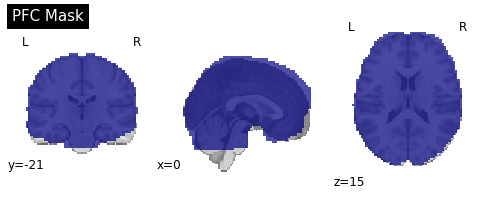

sub: 111 task: sharedreward run: 1


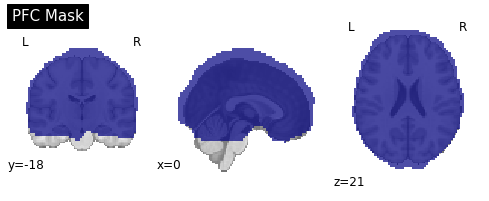

sub: 111 task: sharedreward run: 2


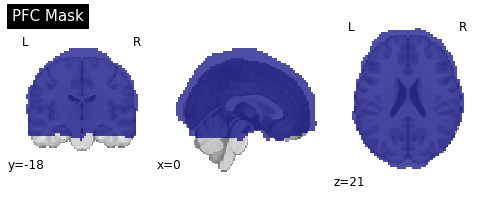

sub: 128 task: sharedreward run: 2


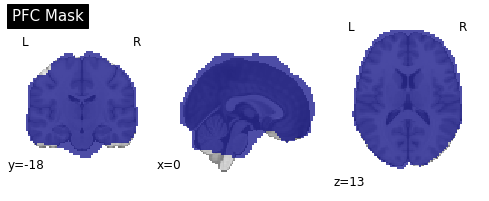

sub: 128 task: sharedreward run: 1


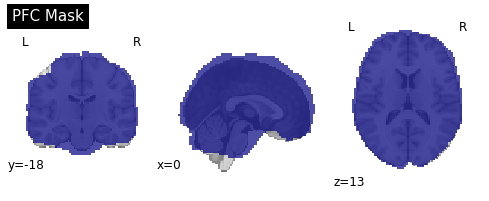

sub: 127 task: sharedreward run: 2


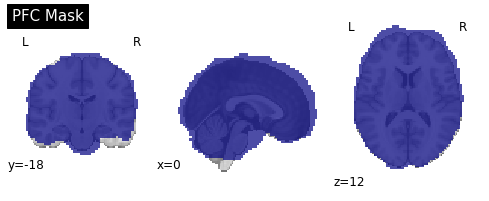

sub: 127 task: sharedreward run: 1


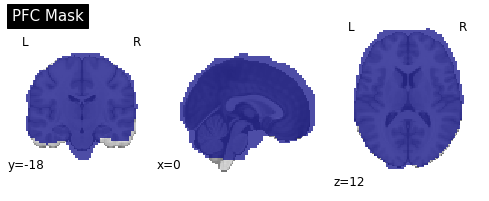

sub: 115 task: sharedreward run: 2


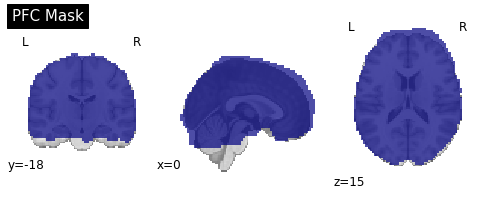

sub: 115 task: sharedreward run: 1


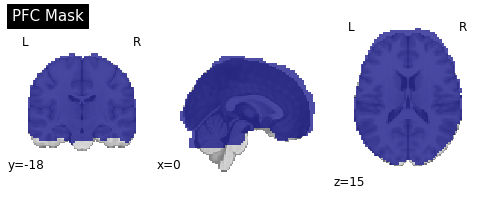

sub: 117 task: sharedreward run: 2


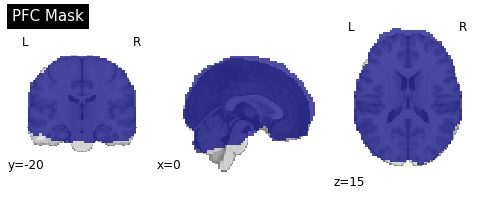

sub: 117 task: sharedreward run: 1


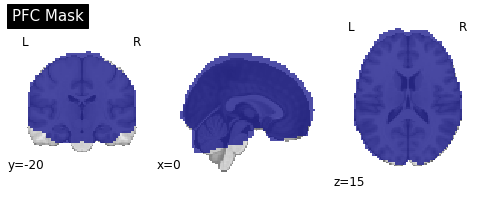

sub: 150 task: sharedreward run: 2


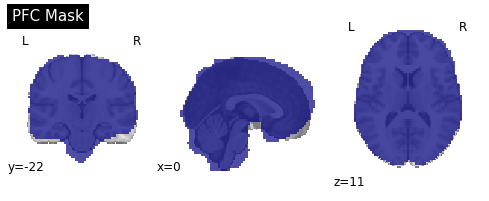

sub: 150 task: sharedreward run: 1


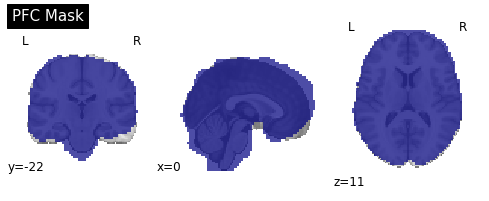

sub: 120 task: sharedreward run: 2


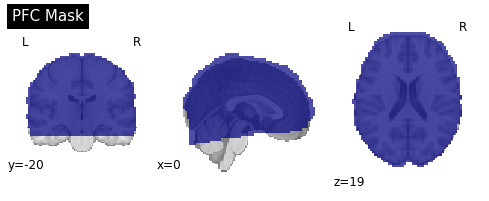

sub: 120 task: sharedreward run: 1


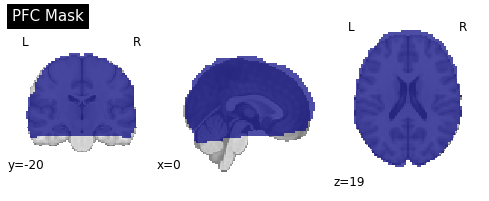

sub: 116 task: sharedreward run: 2


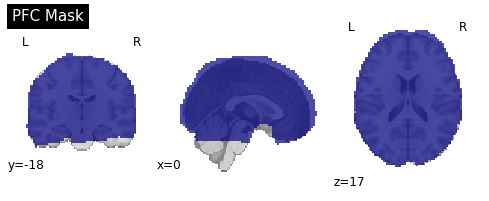

sub: 116 task: sharedreward run: 1


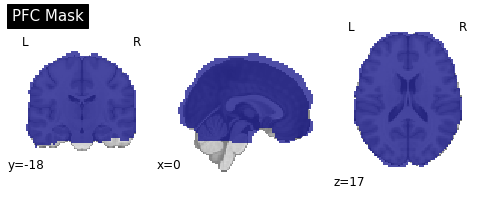

sub: 141 task: sharedreward run: 1


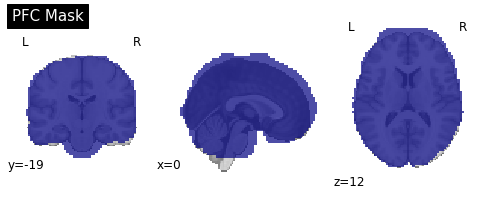

sub: 141 task: sharedreward run: 2


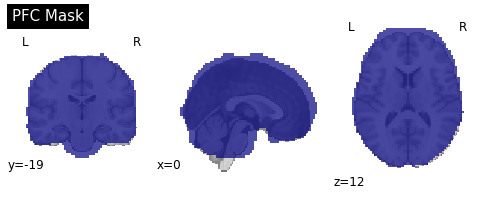

sub: 138 task: sharedreward run: 2


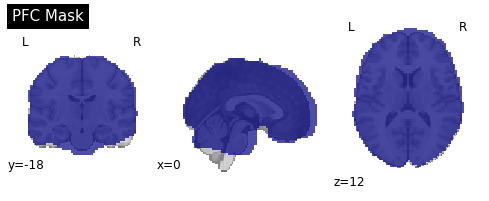

sub: 138 task: sharedreward run: 1


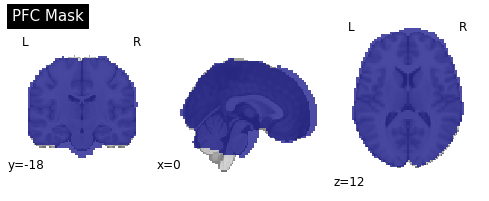

sub: 143 task: sharedreward run: 1


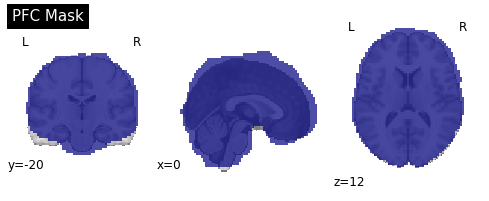

sub: 143 task: sharedreward run: 2


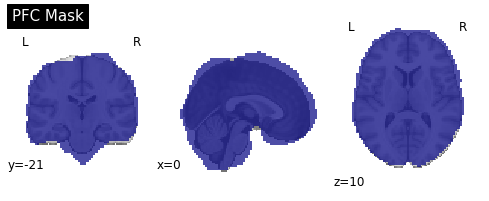

sub: 124 task: sharedreward run: 2


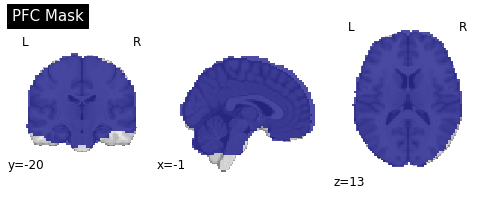

sub: 124 task: sharedreward run: 1


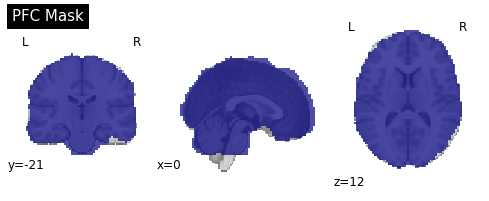

sub: 126 task: sharedreward run: 2


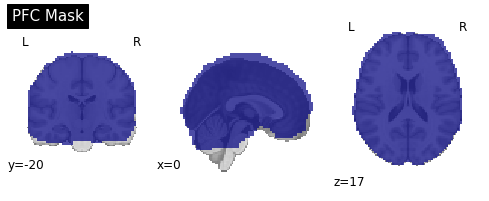

sub: 126 task: sharedreward run: 1


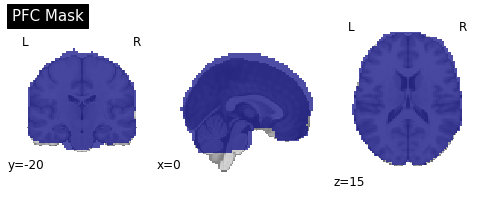

sub: 155 task: sharedreward run: 1


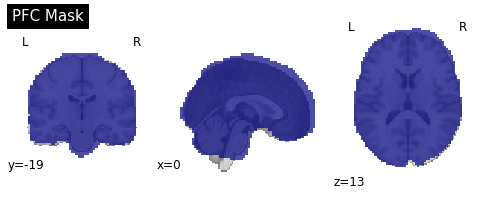

sub: 155 task: sharedreward run: 2


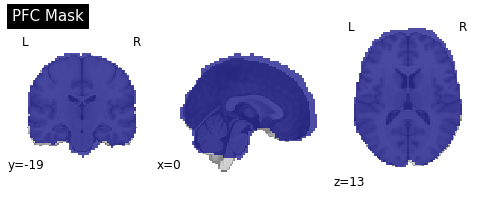

sub: 109 task: sharedreward run: 2


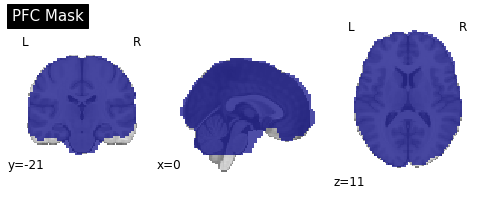

sub: 109 task: sharedreward run: 1


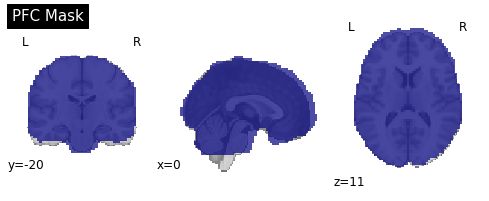

sub: 133 task: sharedreward run: 2


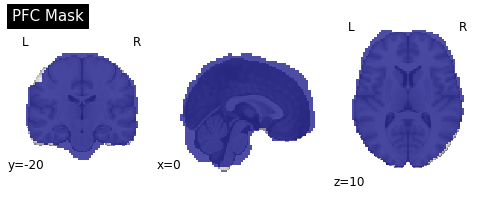

sub: 133 task: sharedreward run: 1


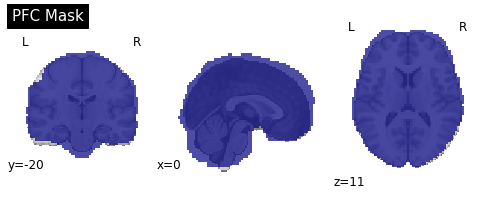

sub: 149 task: sharedreward run: 1


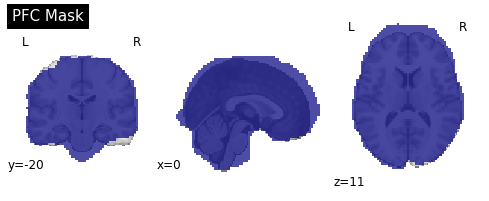

sub: 149 task: sharedreward run: 2


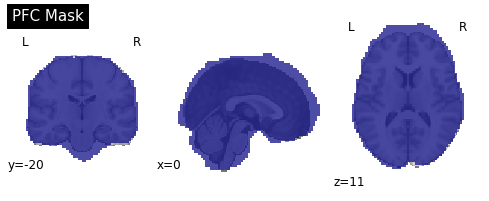

sub: 130 task: sharedreward run: 2


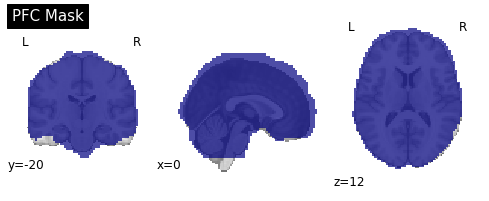

sub: 130 task: sharedreward run: 1


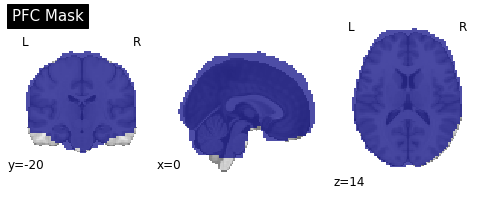

sub: 121 task: sharedreward run: 1


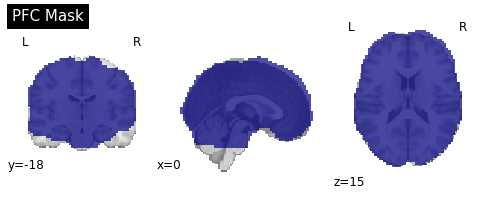

sub: 121 task: sharedreward run: 2


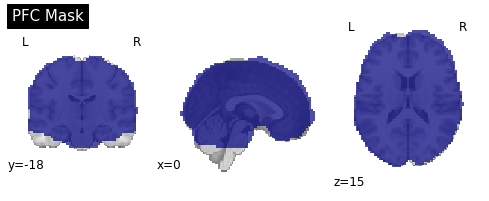

sub: 122 task: sharedreward run: 1


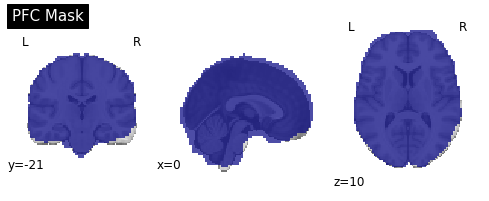

sub: 122 task: sharedreward run: 2


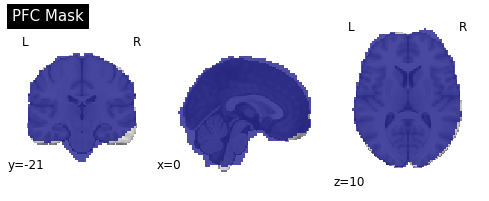

sub: 129 task: sharedreward run: 2


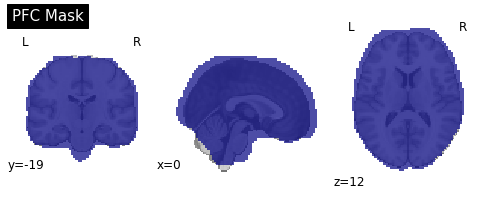

sub: 129 task: sharedreward run: 1


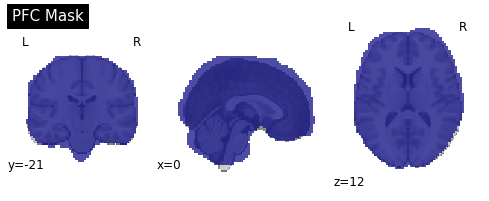

sub: 137 task: sharedreward run: 1


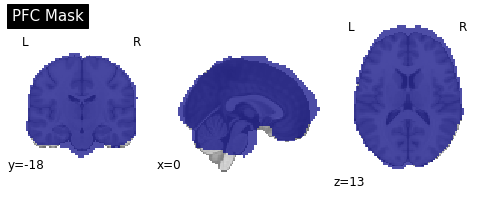

sub: 137 task: sharedreward run: 2


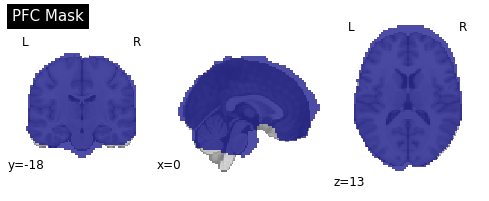

sub: 104 task: sharedreward run: 2


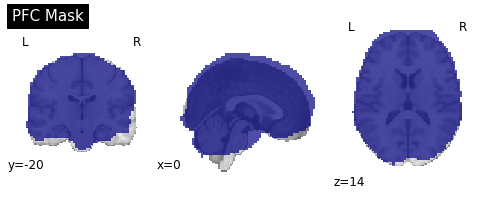

sub: 104 task: sharedreward run: 1


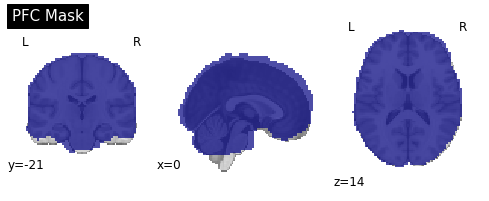

sub: 144 task: sharedreward run: 2


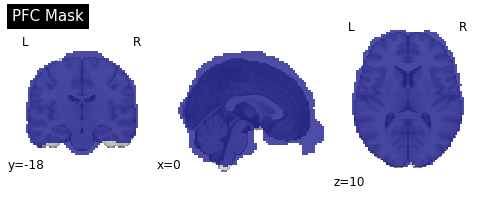

sub: 144 task: sharedreward run: 1


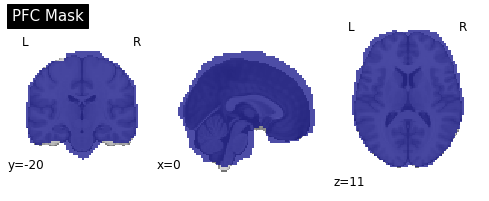

sub: 110 task: sharedreward run: 1


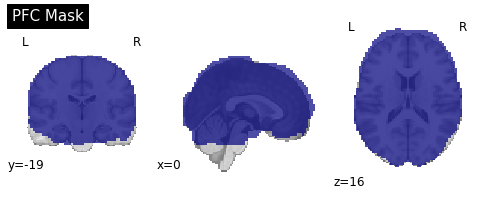

sub: 110 task: sharedreward run: 2


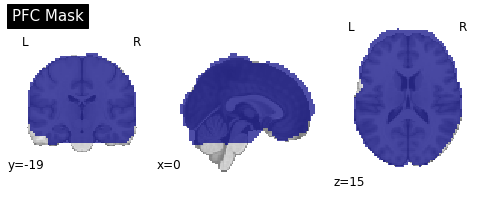

sub: 135 task: trust run: 5


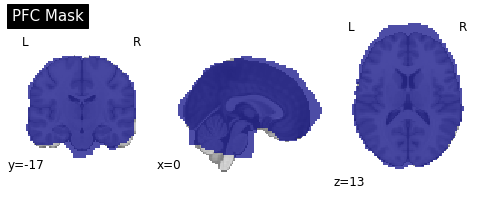

sub: 135 task: trust run: 2


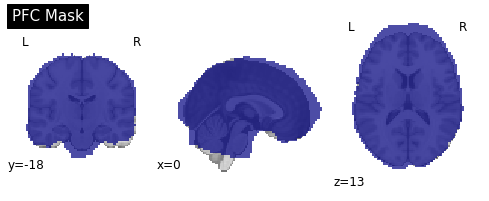

sub: 135 task: trust run: 1


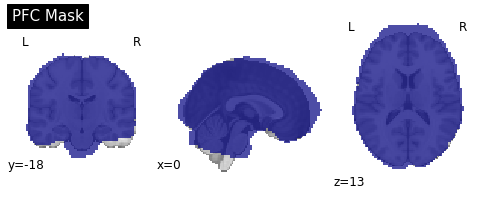

sub: 135 task: trust run: 4


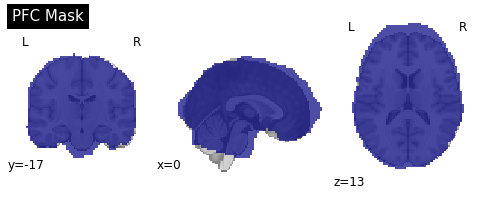

sub: 135 task: trust run: 3


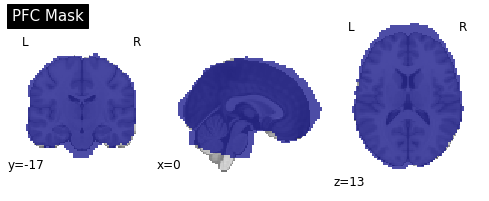

sub: 158 task: trust run: 5


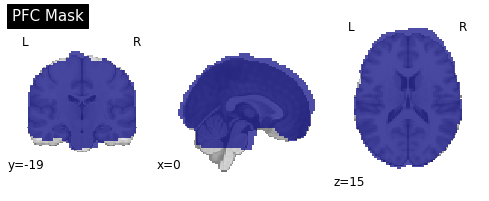

sub: 158 task: trust run: 3


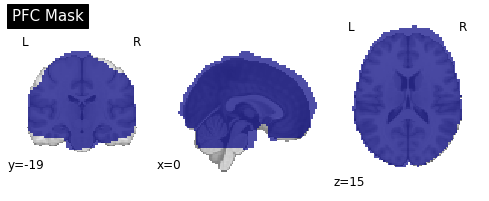

sub: 158 task: trust run: 4


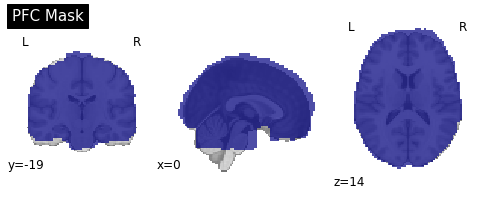

sub: 158 task: trust run: 1


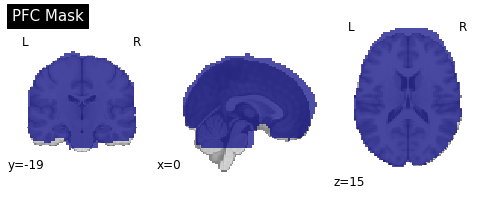

sub: 158 task: trust run: 2


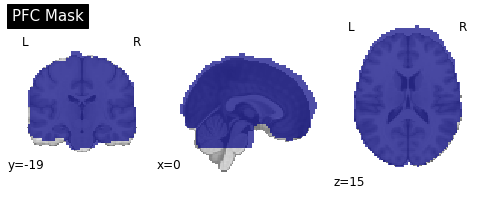

sub: 118 task: trust run: 2


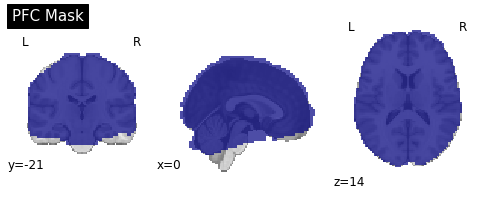

sub: 118 task: trust run: 1


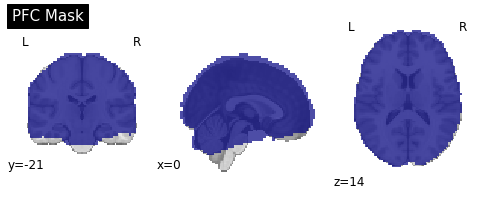

sub: 118 task: trust run: 3


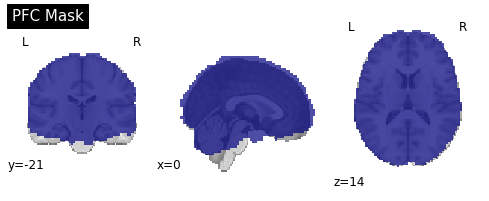

sub: 118 task: trust run: 4


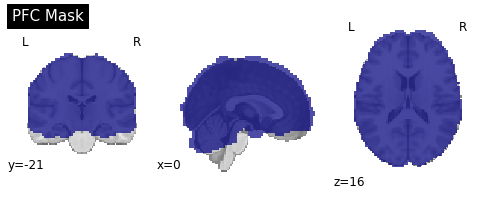

sub: 118 task: trust run: 5


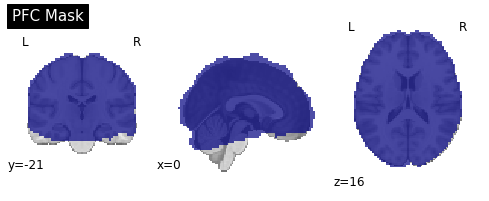

sub: 154 task: trust run: 1


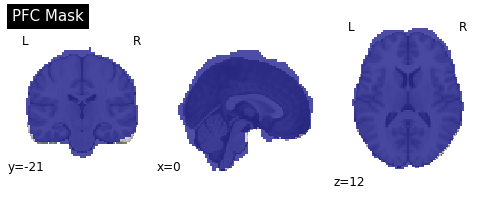

sub: 154 task: trust run: 2


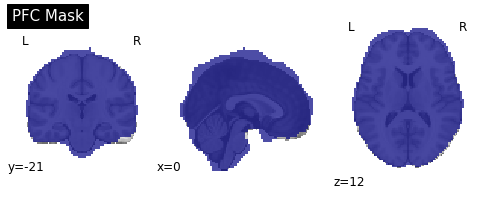

sub: 107 task: trust run: 5


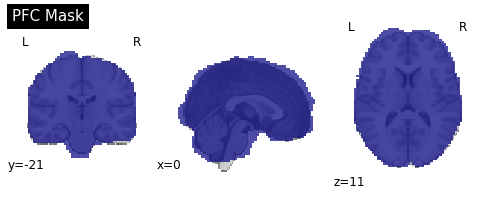

sub: 107 task: trust run: 2


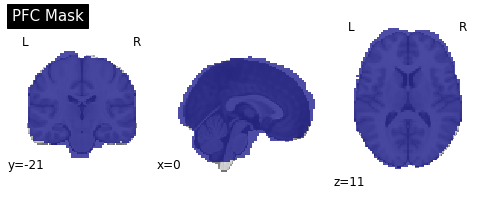

sub: 107 task: trust run: 1


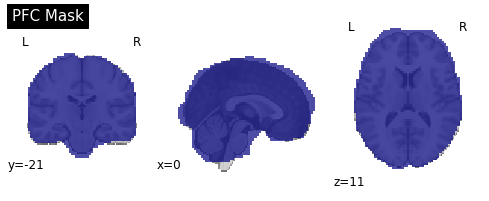

sub: 107 task: trust run: 4


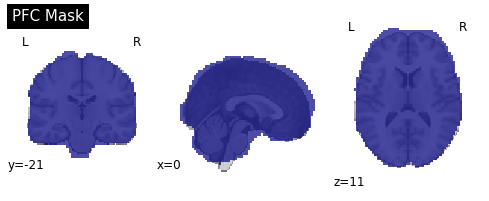

sub: 107 task: trust run: 3


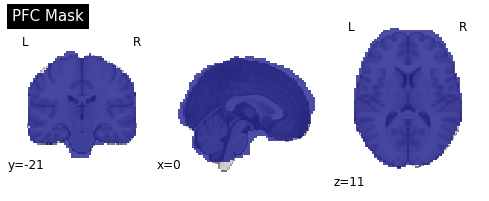

sub: 142 task: trust run: 1


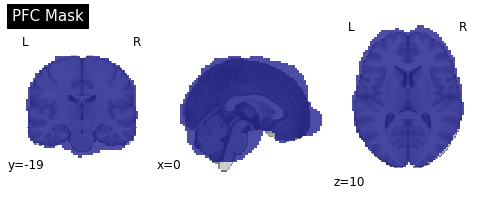

sub: 142 task: trust run: 4


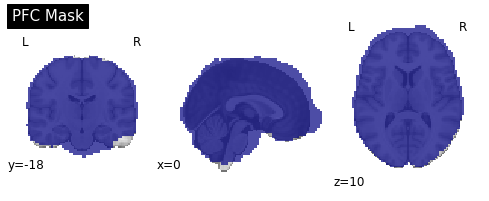

sub: 142 task: trust run: 5


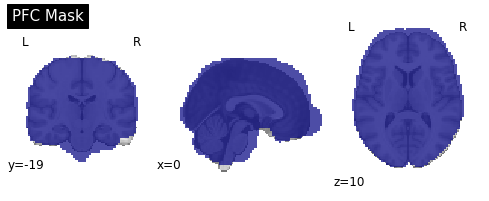

sub: 142 task: trust run: 2


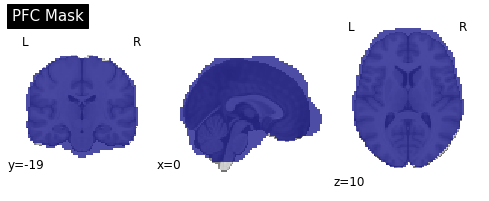

sub: 142 task: trust run: 3


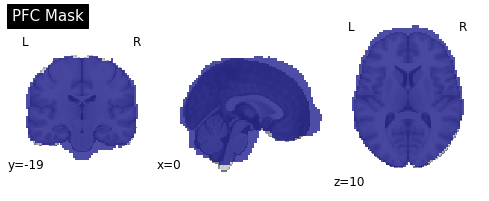

sub: 113 task: trust run: 4


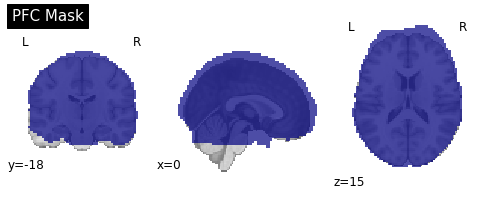

sub: 113 task: trust run: 5


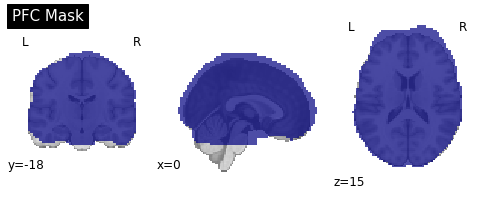

sub: 113 task: trust run: 3


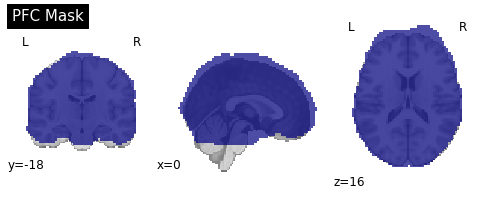

sub: 113 task: trust run: 2


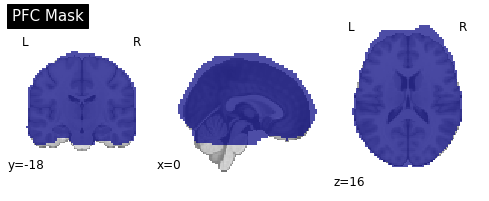

sub: 113 task: trust run: 1


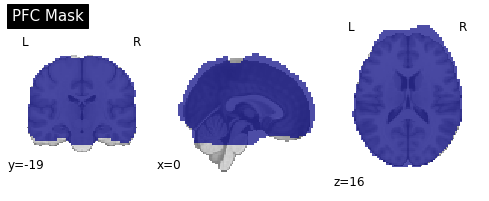

sub: 159 task: trust run: 4


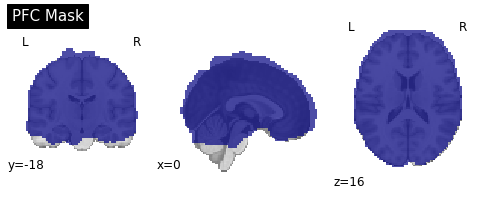

sub: 159 task: trust run: 5


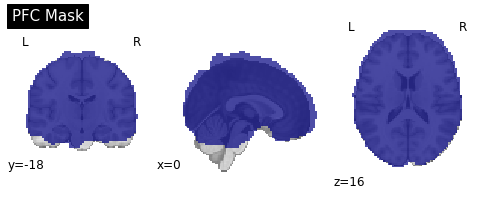

sub: 159 task: trust run: 3


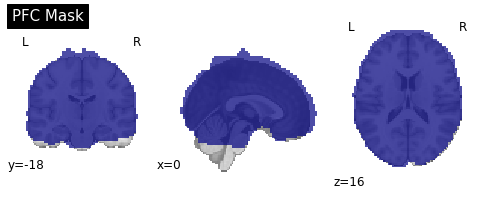

sub: 159 task: trust run: 1


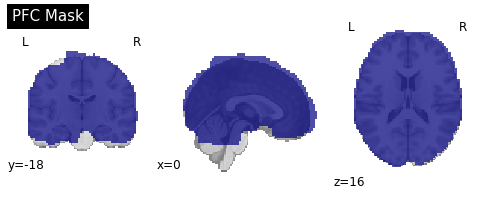

sub: 159 task: trust run: 2


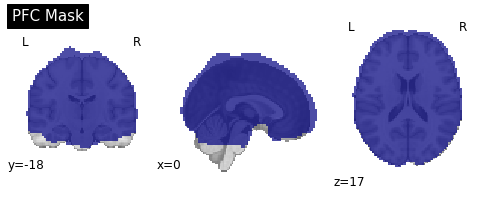

sub: 152 task: trust run: 2


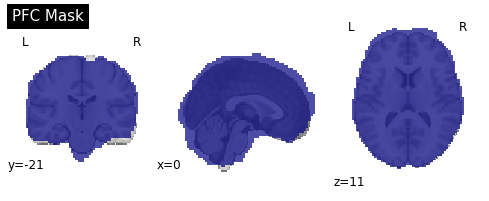

sub: 152 task: trust run: 1


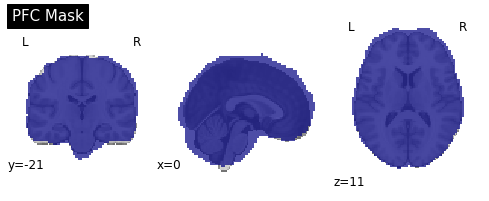

sub: 106 task: trust run: 1


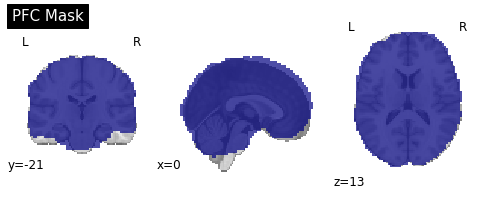

sub: 106 task: trust run: 3


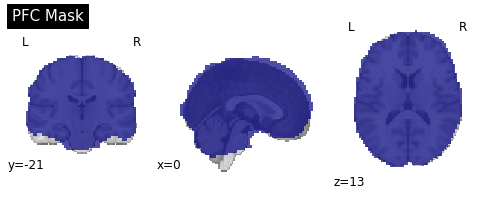

sub: 106 task: trust run: 2


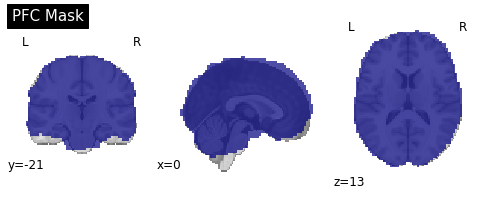

sub: 132 task: trust run: 4


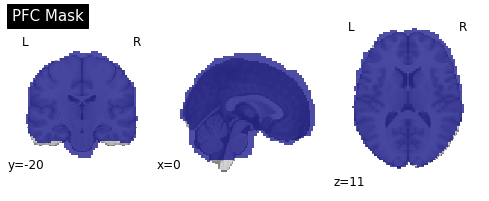

sub: 132 task: trust run: 5


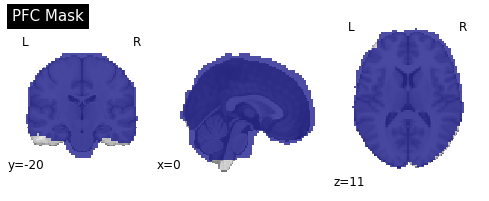

sub: 132 task: trust run: 2


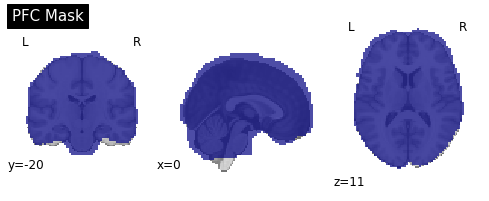

sub: 132 task: trust run: 3


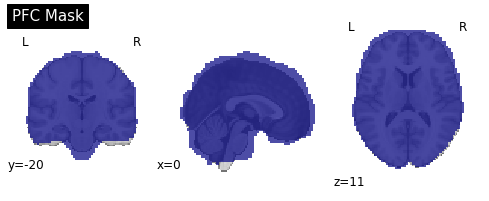

sub: 132 task: trust run: 1


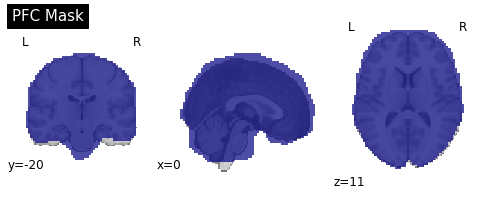

sub: 112 task: trust run: 2


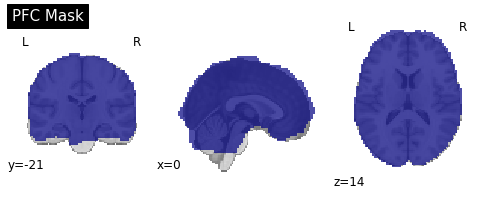

sub: 112 task: trust run: 3


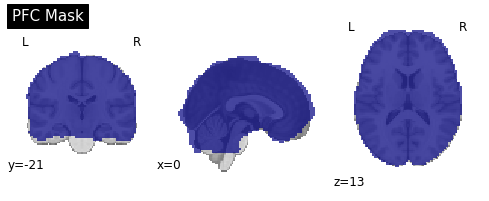

sub: 112 task: trust run: 4


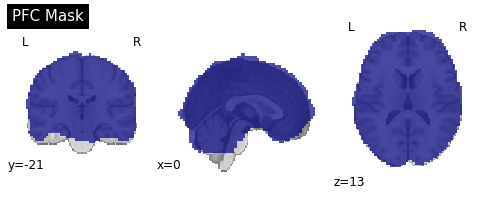

sub: 112 task: trust run: 5


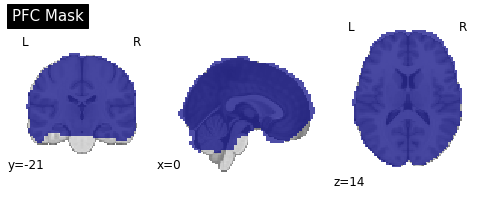

sub: 112 task: trust run: 1


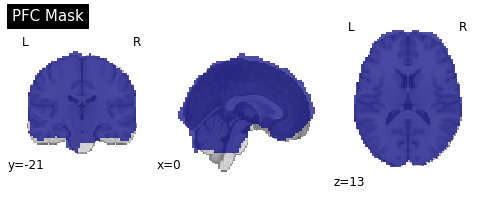

sub: 134 task: trust run: 3


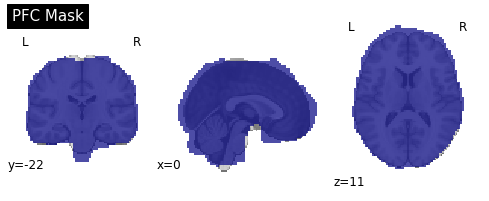

sub: 134 task: trust run: 4


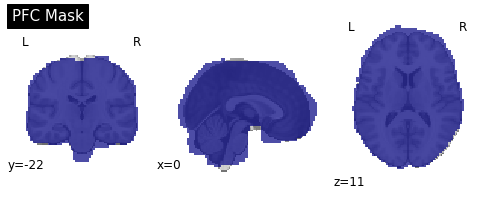

sub: 134 task: trust run: 5


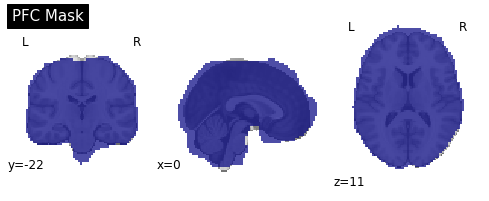

sub: 134 task: trust run: 2


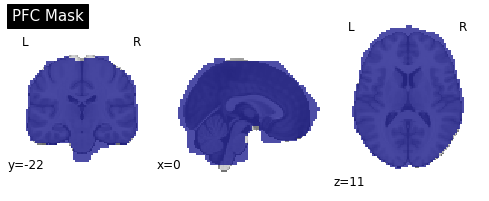

sub: 134 task: trust run: 1


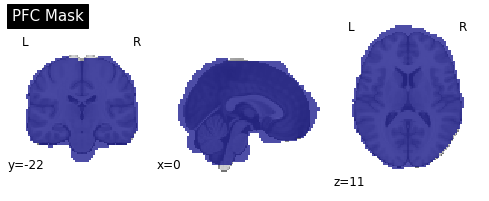

sub: 140 task: trust run: 5


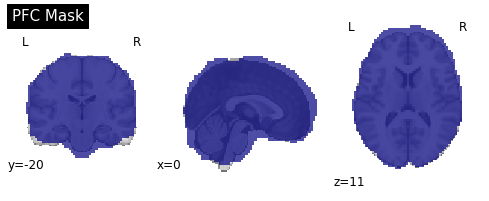

sub: 140 task: trust run: 1


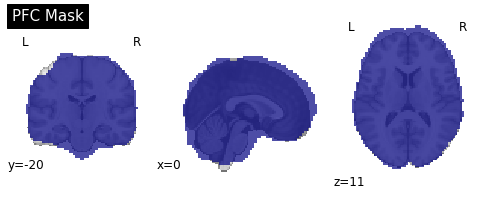

sub: 140 task: trust run: 4


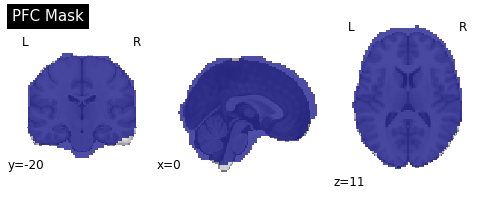

sub: 140 task: trust run: 3


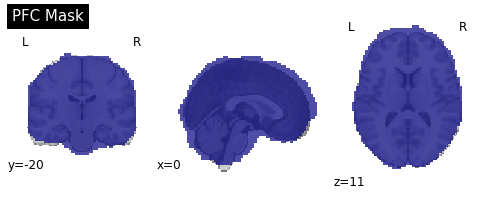

sub: 140 task: trust run: 2


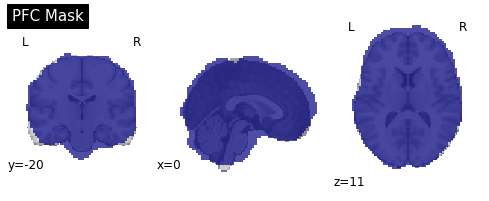

sub: 153 task: trust run: 3


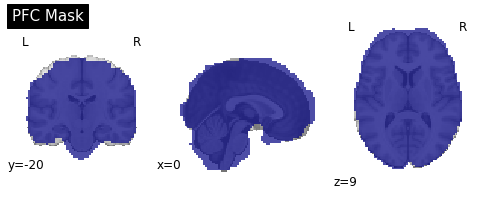

sub: 153 task: trust run: 2


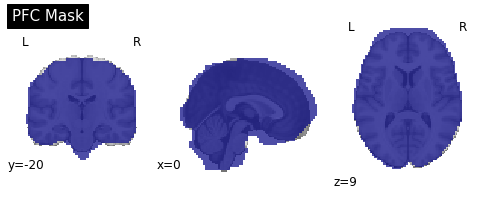

sub: 153 task: trust run: 4


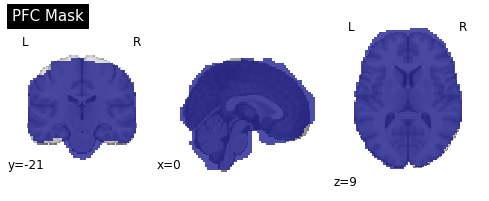

sub: 153 task: trust run: 1


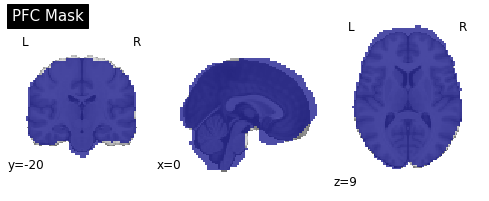

sub: 153 task: trust run: 5


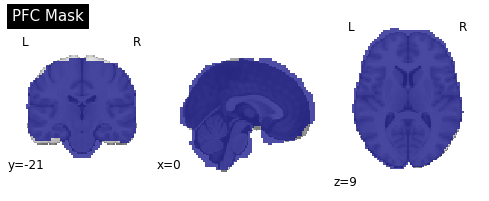

sub: 131 task: trust run: 3


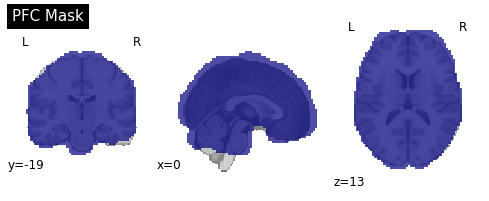

sub: 131 task: trust run: 1


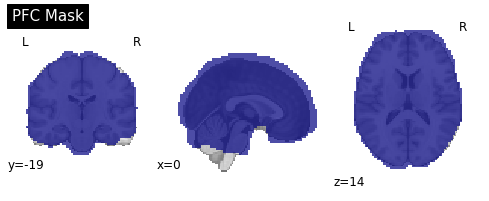

sub: 131 task: trust run: 4


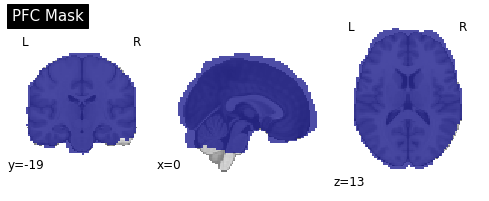

sub: 131 task: trust run: 2


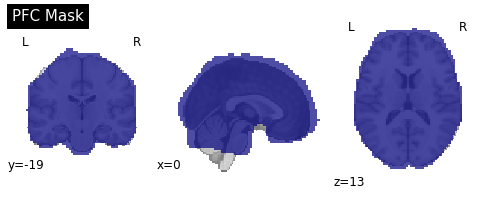

sub: 131 task: trust run: 5


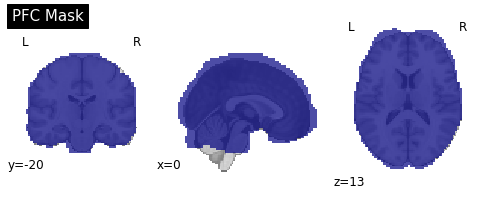

sub: 125 task: trust run: 1


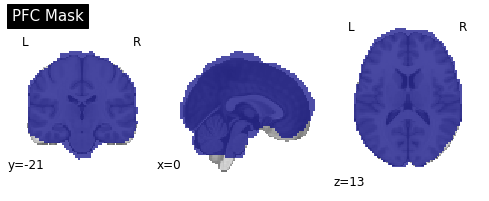

sub: 125 task: trust run: 5


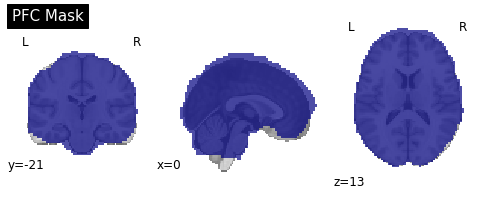

sub: 125 task: trust run: 2


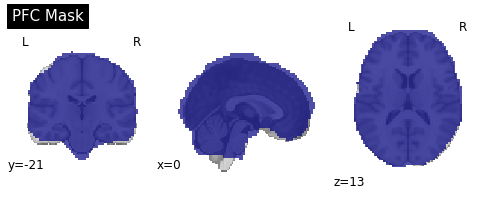

sub: 125 task: trust run: 3


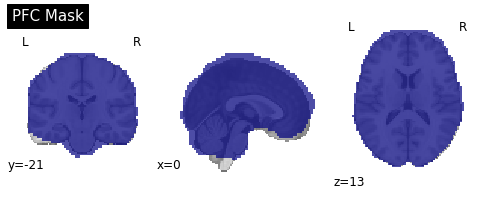

sub: 125 task: trust run: 4


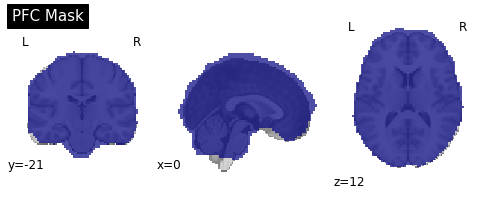

sub: 151 task: trust run: 2


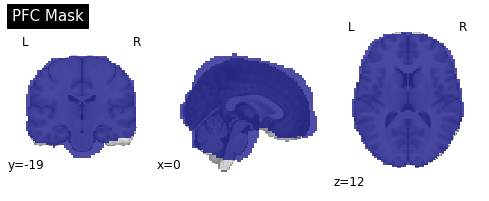

sub: 151 task: trust run: 4


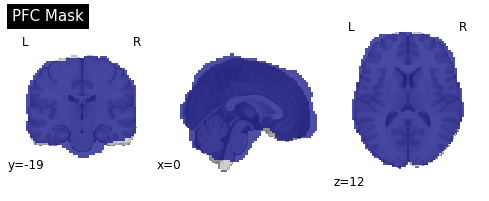

sub: 151 task: trust run: 1


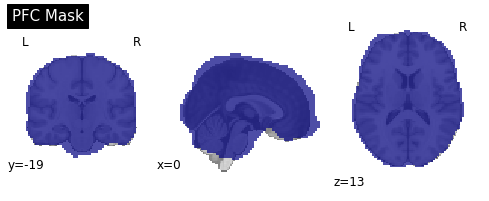

sub: 151 task: trust run: 5


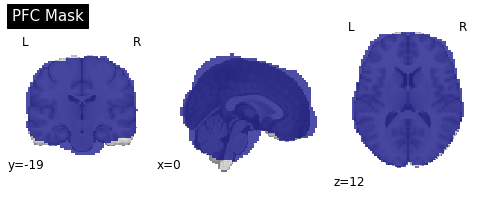

sub: 151 task: trust run: 3


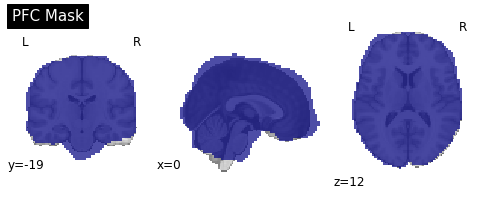

sub: 136 task: trust run: 1


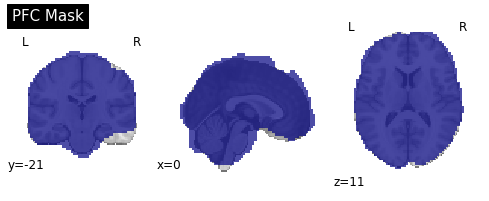

sub: 136 task: trust run: 2


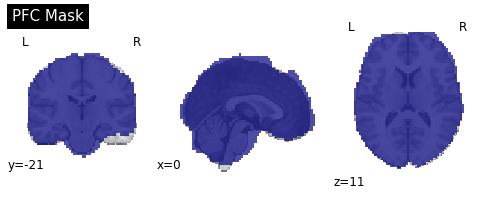

sub: 145 task: trust run: 2


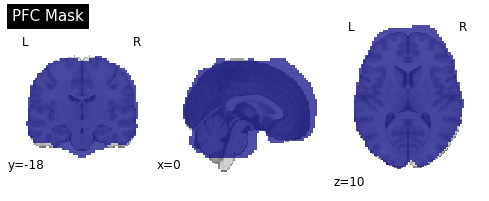

sub: 145 task: trust run: 1


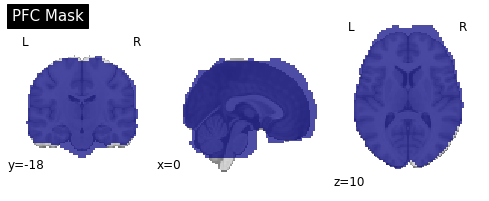

sub: 147 task: trust run: 5


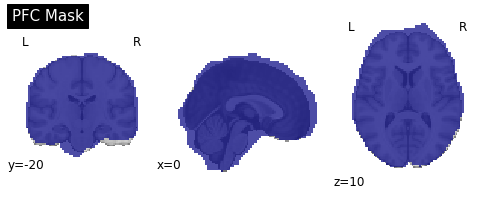

sub: 147 task: trust run: 4


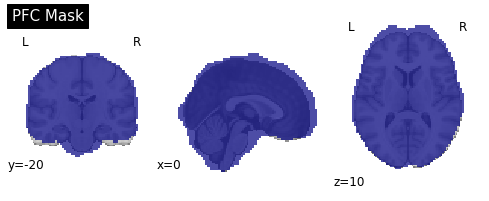

sub: 147 task: trust run: 2


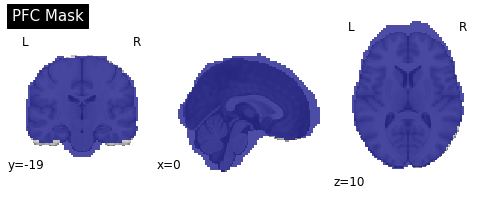

sub: 147 task: trust run: 1


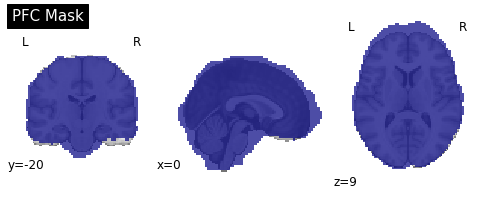

sub: 147 task: trust run: 3


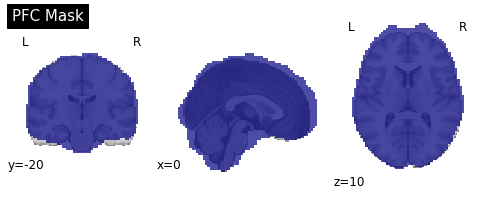

sub: 105 task: trust run: 5


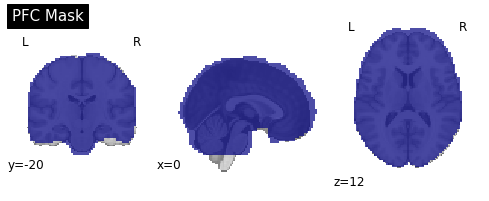

sub: 105 task: trust run: 3


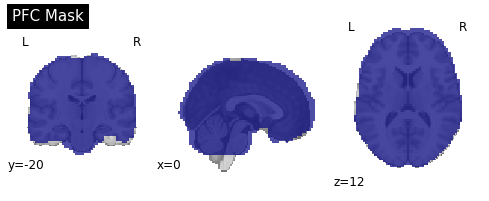

sub: 105 task: trust run: 4


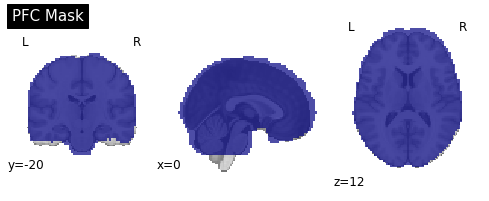

sub: 105 task: trust run: 1


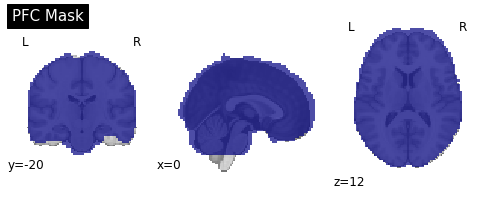

sub: 105 task: trust run: 2


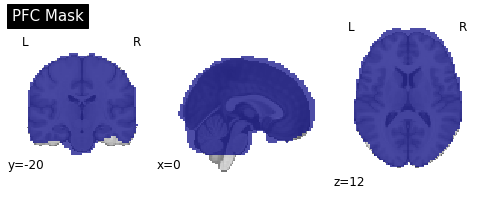

sub: 108 task: trust run: 1


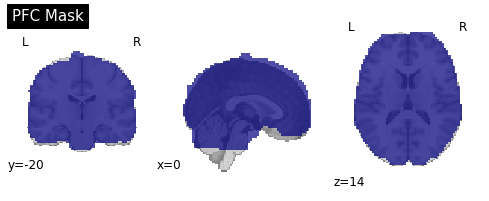

sub: 108 task: trust run: 4


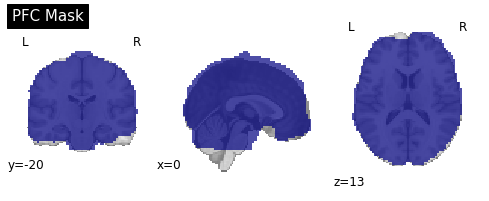

sub: 108 task: trust run: 5


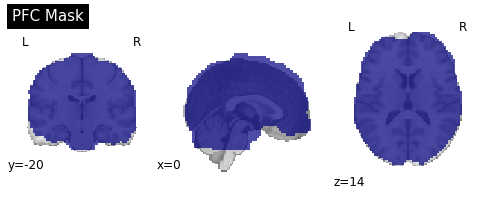

sub: 108 task: trust run: 2


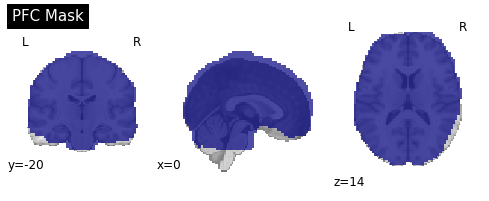

sub: 108 task: trust run: 3


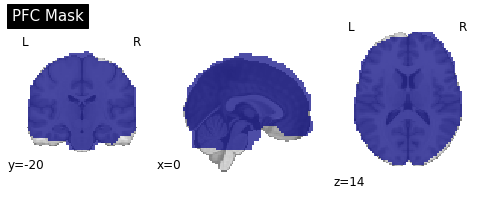

sub: 156 task: trust run: 1


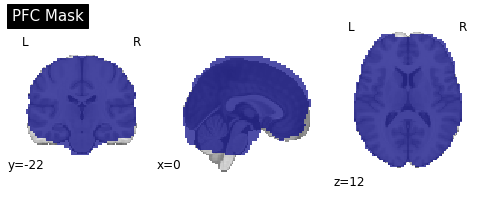

sub: 156 task: trust run: 2


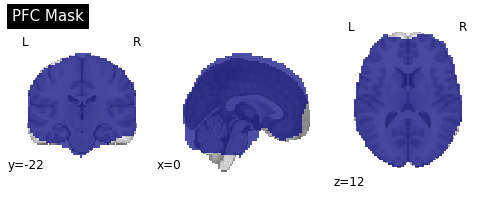

sub: 157 task: trust run: 1


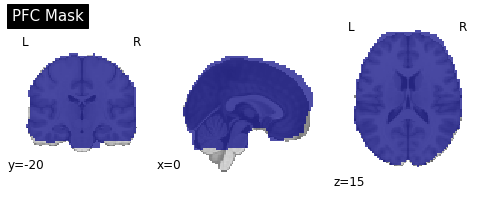

sub: 157 task: trust run: 4


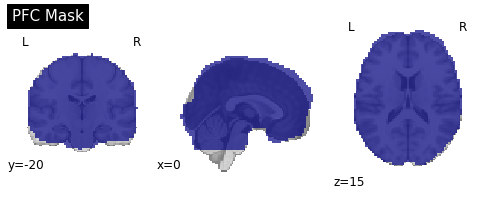

sub: 157 task: trust run: 3


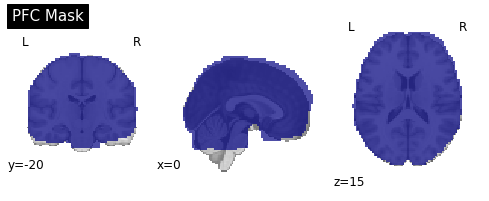

sub: 157 task: trust run: 2


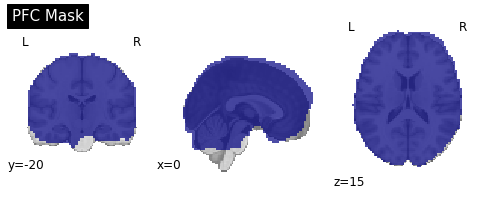

sub: 157 task: trust run: 5


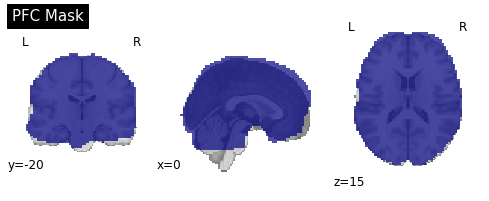

sub: 111 task: trust run: 2


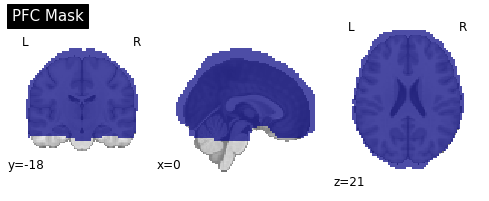

sub: 111 task: trust run: 1


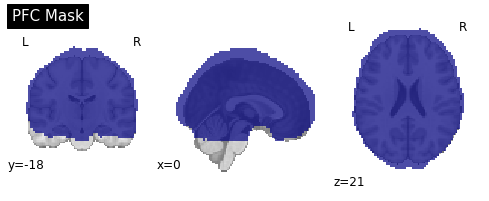

sub: 111 task: trust run: 4


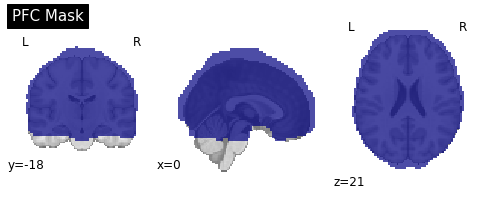

sub: 111 task: trust run: 5


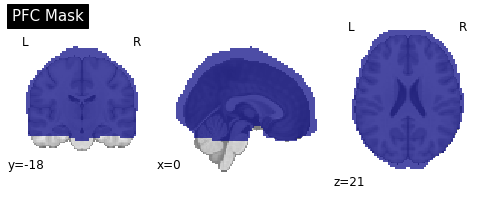

sub: 111 task: trust run: 3


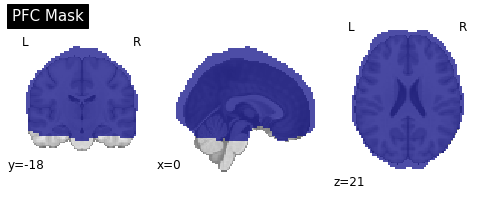

sub: 128 task: trust run: 3


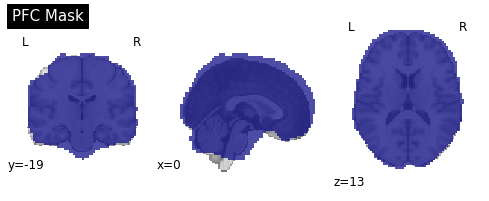

sub: 128 task: trust run: 4


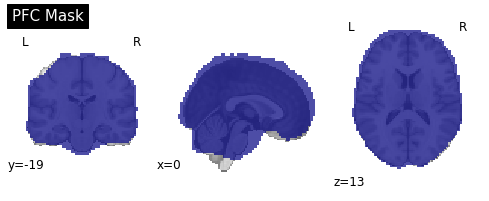

sub: 128 task: trust run: 1


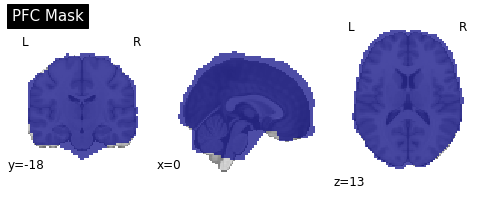

sub: 128 task: trust run: 5


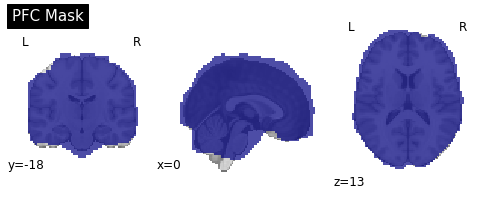

sub: 128 task: trust run: 2


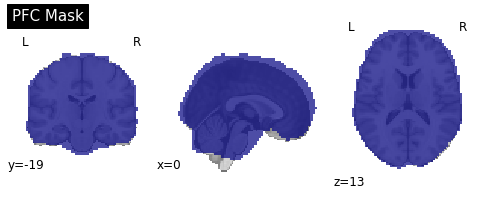

sub: 127 task: trust run: 5


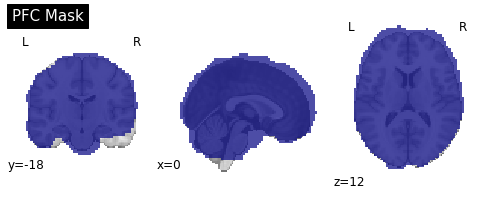

sub: 127 task: trust run: 4


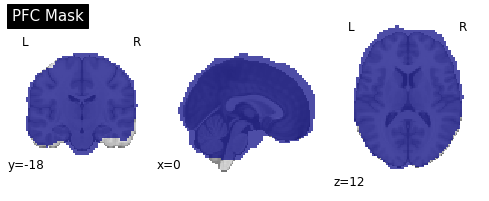

sub: 127 task: trust run: 3


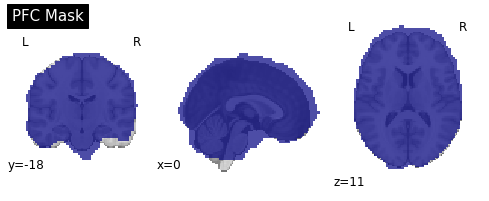

sub: 127 task: trust run: 1


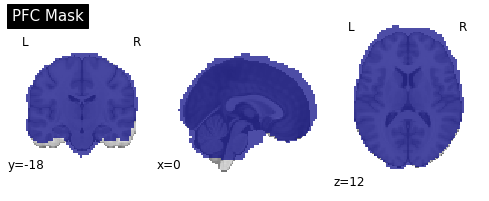

sub: 127 task: trust run: 2


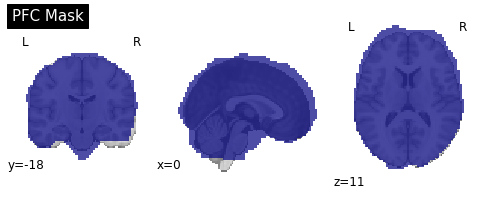

sub: 115 task: trust run: 4


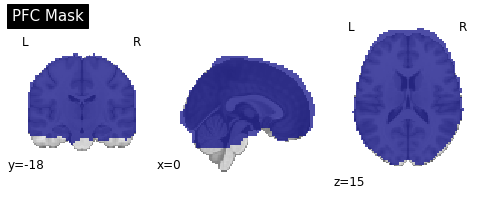

sub: 115 task: trust run: 1


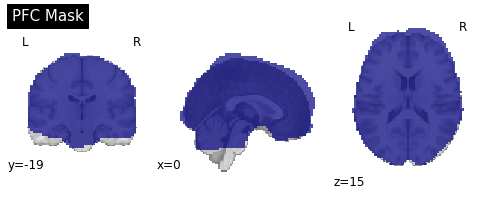

sub: 115 task: trust run: 5


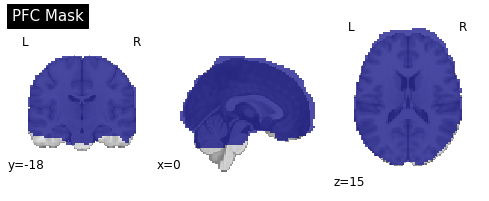

sub: 115 task: trust run: 2


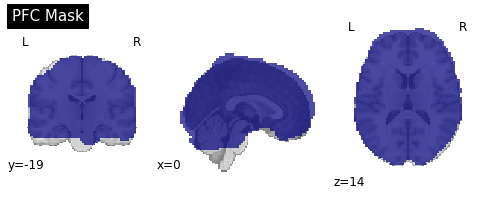

sub: 115 task: trust run: 3


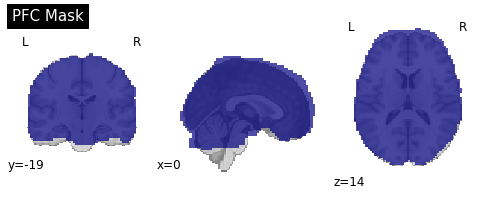

sub: 117 task: trust run: 2


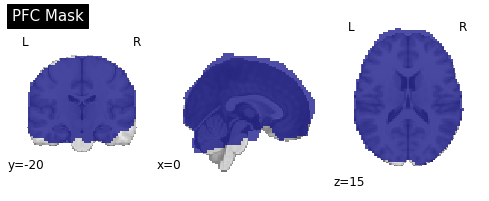

sub: 117 task: trust run: 3


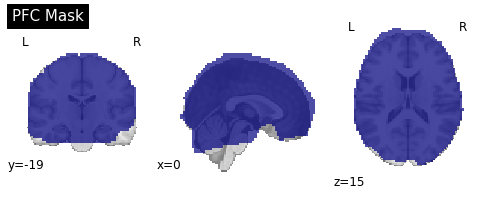

sub: 117 task: trust run: 5


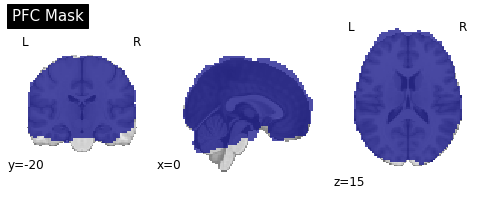

sub: 117 task: trust run: 1


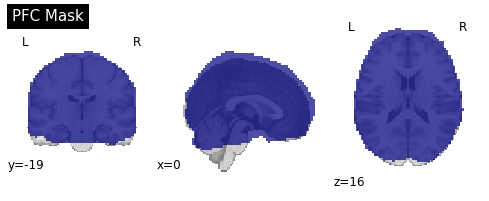

sub: 117 task: trust run: 4


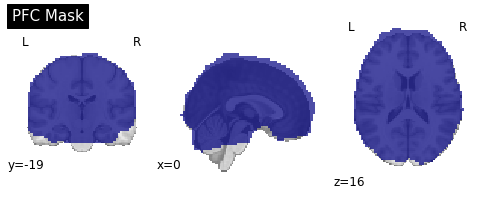

sub: 150 task: trust run: 3


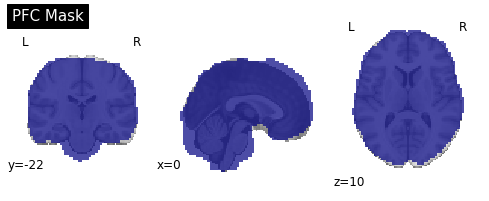

sub: 150 task: trust run: 5


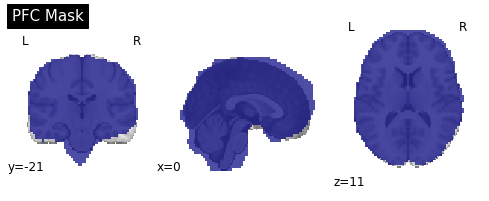

sub: 150 task: trust run: 1


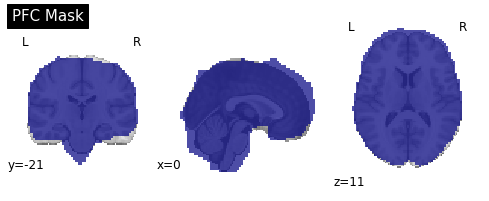

sub: 150 task: trust run: 2


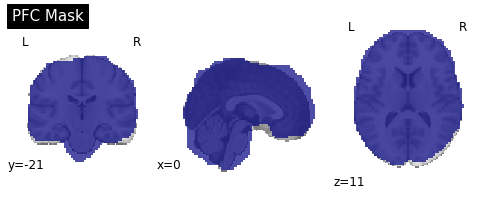

sub: 150 task: trust run: 4


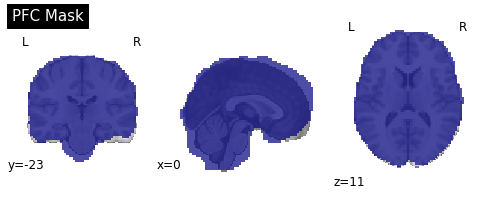

sub: 120 task: trust run: 3


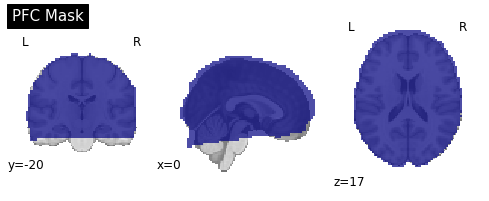

sub: 120 task: trust run: 2


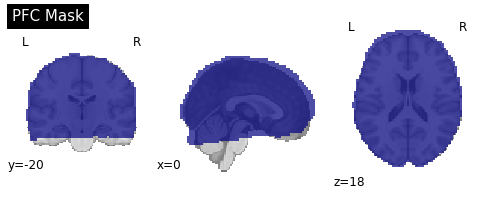

sub: 120 task: trust run: 5


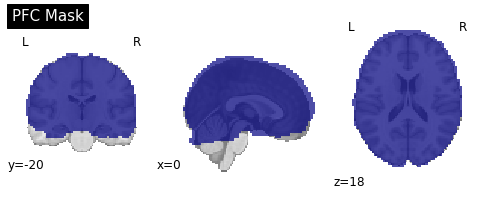

sub: 120 task: trust run: 1


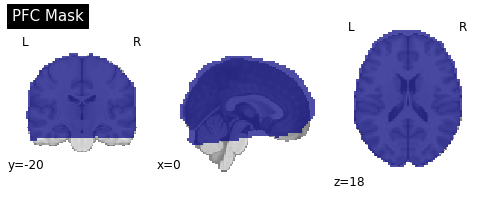

sub: 120 task: trust run: 4


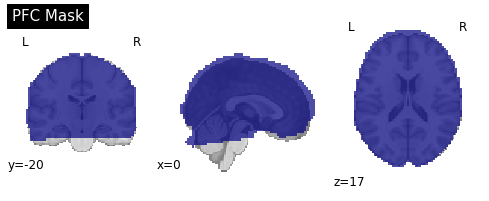

sub: 116 task: trust run: 5


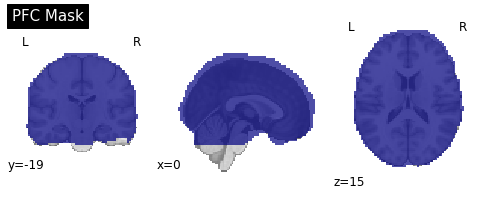

sub: 116 task: trust run: 3


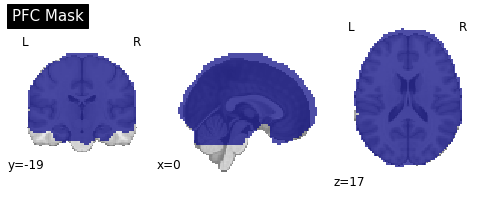

sub: 116 task: trust run: 1


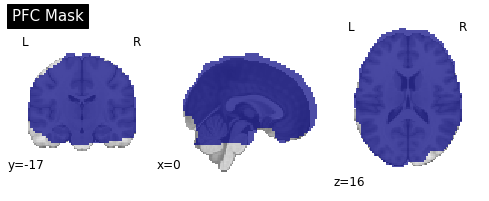

sub: 116 task: trust run: 4


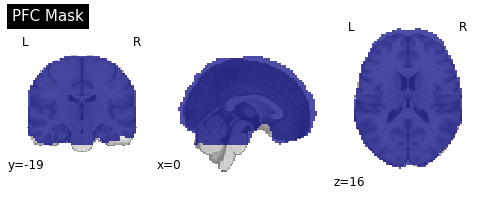

sub: 116 task: trust run: 2


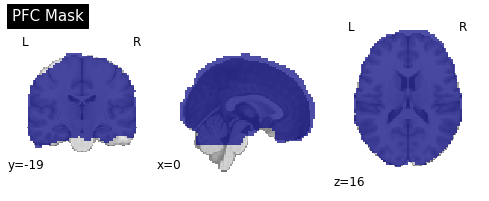

sub: 141 task: trust run: 4


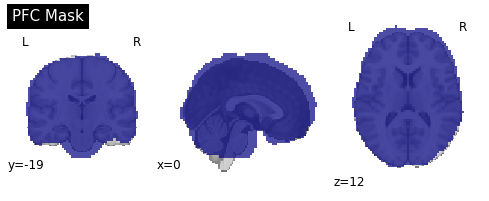

sub: 141 task: trust run: 2


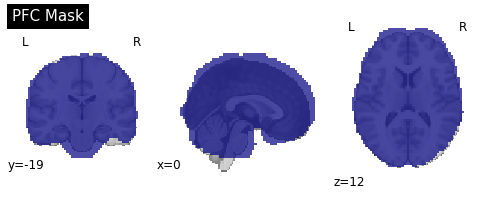

sub: 141 task: trust run: 3


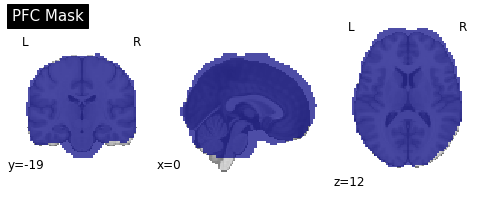

sub: 141 task: trust run: 1


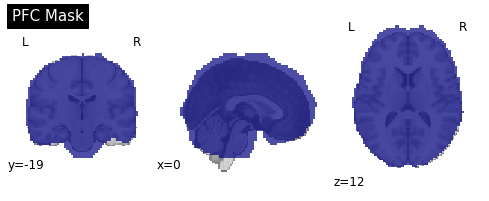

sub: 138 task: trust run: 2


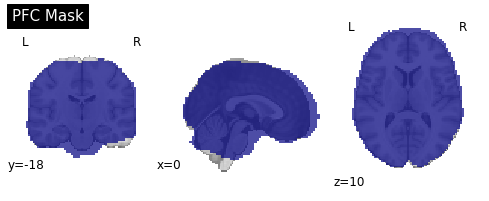

sub: 138 task: trust run: 5


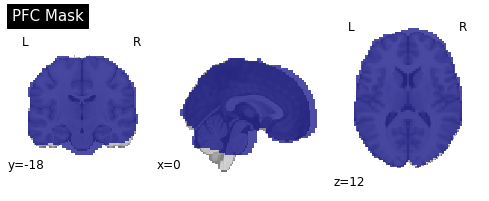

sub: 138 task: trust run: 4


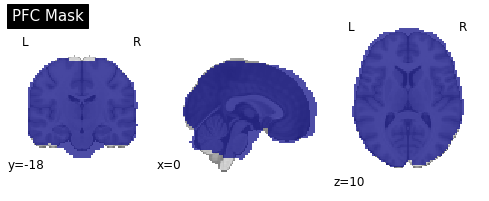

sub: 138 task: trust run: 1


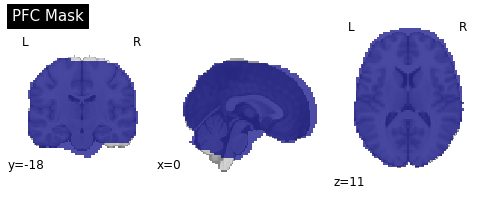

sub: 138 task: trust run: 3


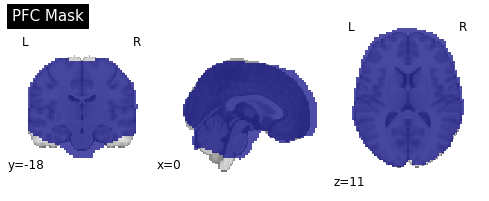

sub: 143 task: trust run: 1


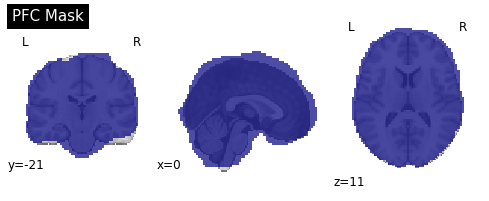

sub: 143 task: trust run: 2


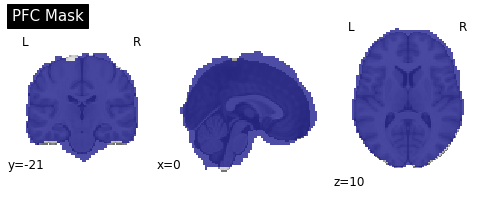

sub: 143 task: trust run: 3


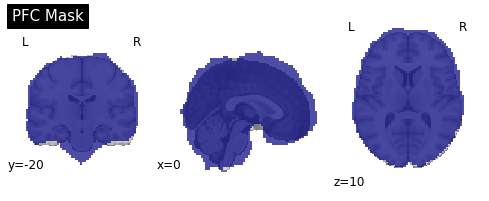

sub: 124 task: trust run: 2


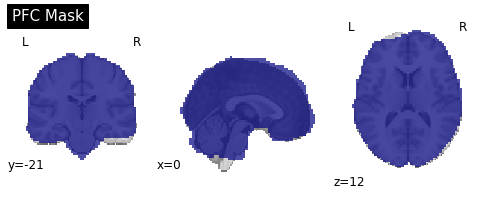

sub: 124 task: trust run: 1


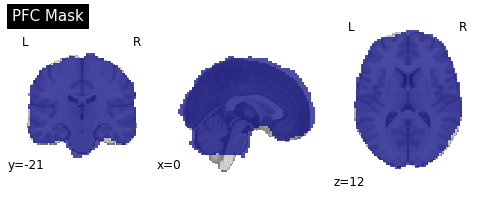

sub: 124 task: trust run: 3


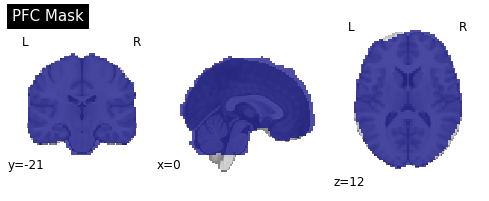

sub: 124 task: trust run: 5


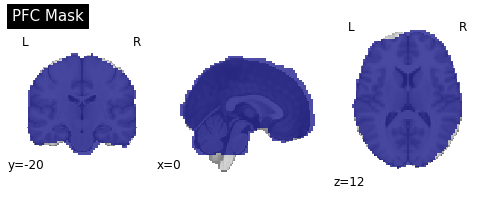

sub: 124 task: trust run: 4


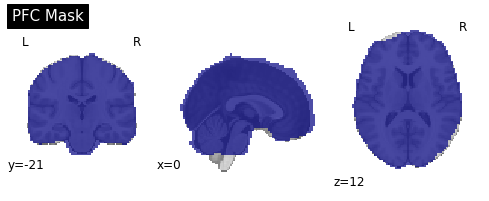

sub: 126 task: trust run: 2


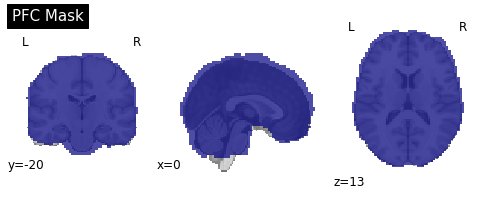

sub: 126 task: trust run: 3


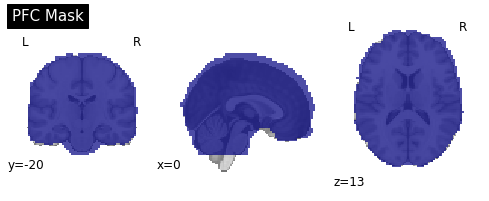

sub: 126 task: trust run: 4


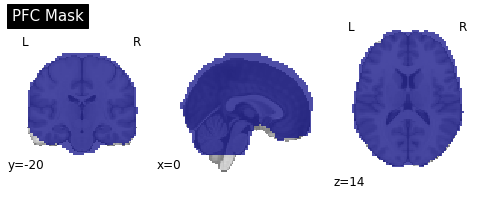

sub: 126 task: trust run: 1


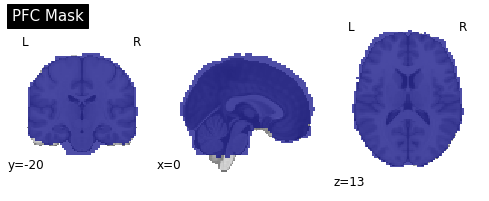

sub: 126 task: trust run: 5


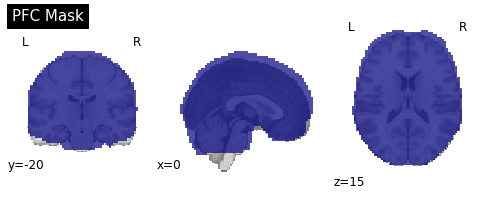

sub: 155 task: trust run: 3


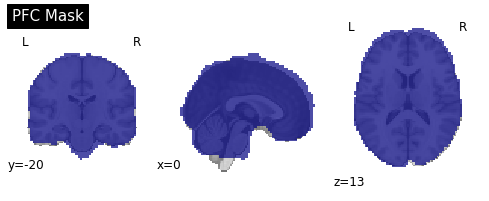

sub: 155 task: trust run: 1


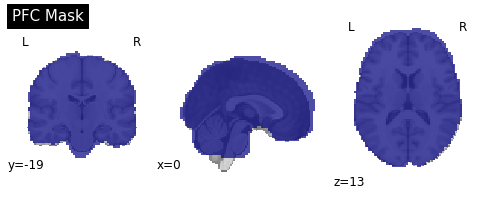

sub: 155 task: trust run: 5


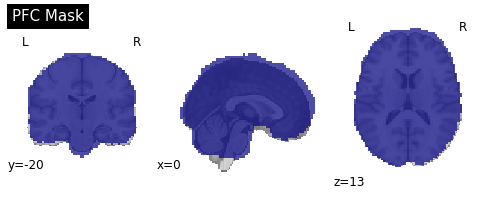

sub: 155 task: trust run: 2


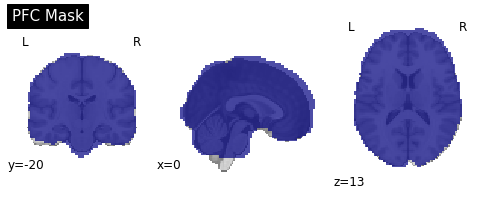

sub: 155 task: trust run: 4


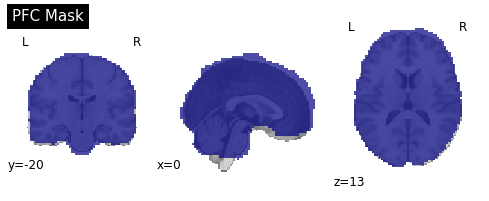

sub: 109 task: trust run: 2


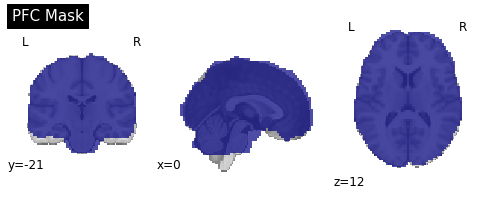

sub: 109 task: trust run: 1


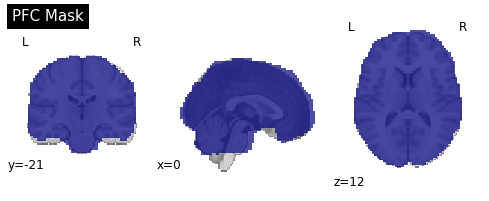

sub: 133 task: trust run: 3


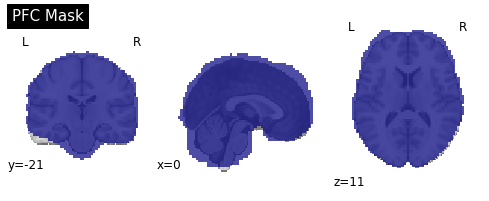

sub: 133 task: trust run: 1


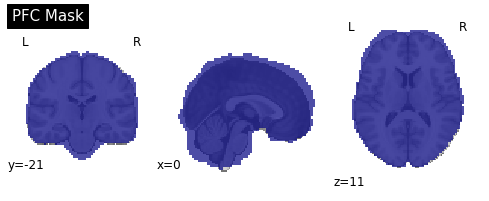

sub: 133 task: trust run: 5


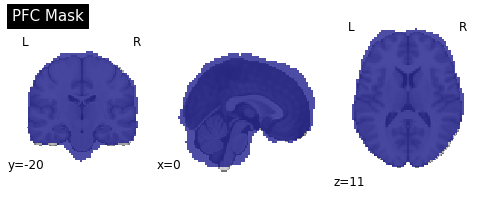

sub: 133 task: trust run: 4


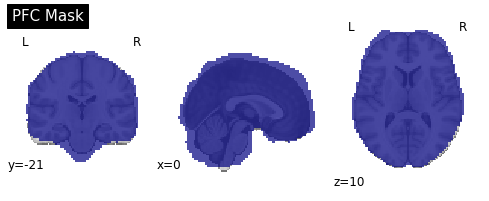

sub: 133 task: trust run: 2


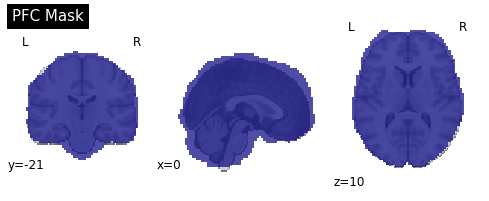

sub: 149 task: trust run: 4


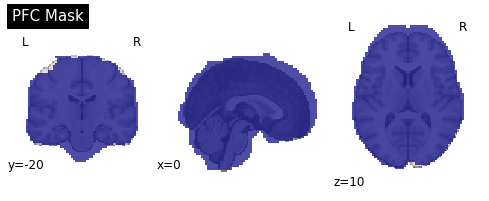

sub: 149 task: trust run: 1


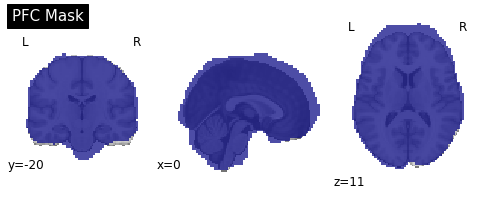

sub: 149 task: trust run: 3


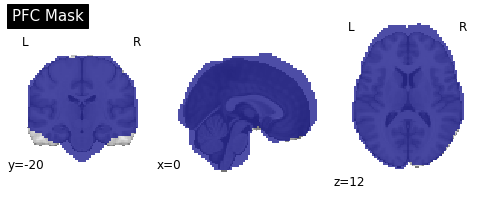

sub: 149 task: trust run: 2


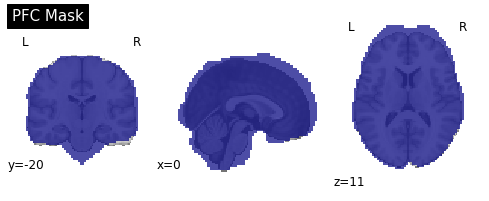

sub: 130 task: trust run: 3


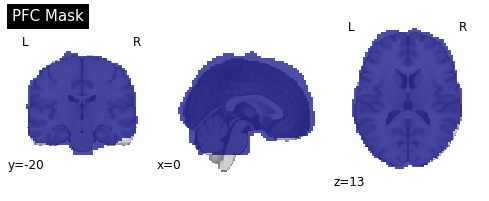

sub: 130 task: trust run: 5


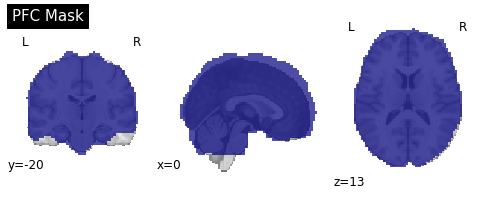

sub: 130 task: trust run: 4


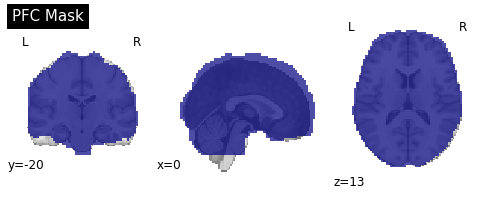

sub: 130 task: trust run: 1


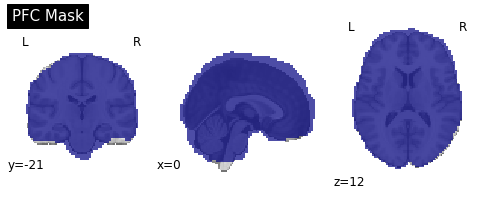

sub: 130 task: trust run: 2


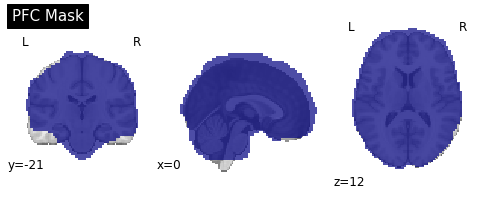

sub: 121 task: trust run: 5


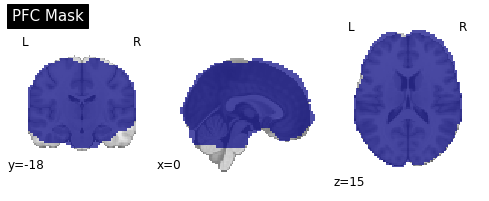

sub: 121 task: trust run: 2


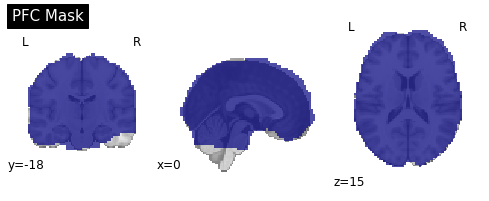

sub: 121 task: trust run: 1


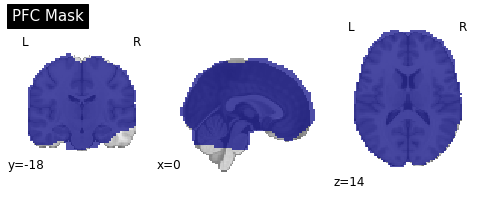

sub: 121 task: trust run: 4


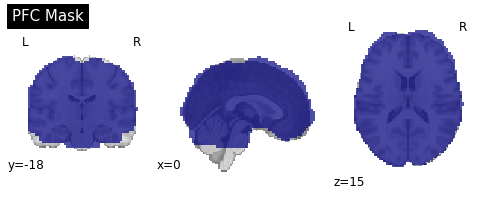

sub: 121 task: trust run: 3


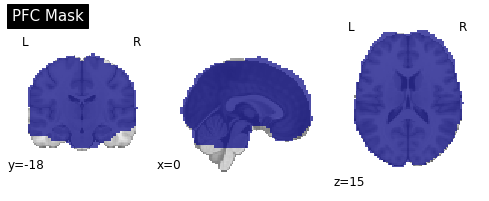

sub: 122 task: trust run: 3


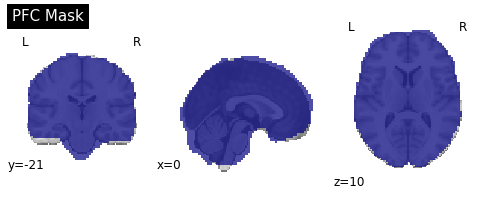

sub: 122 task: trust run: 5


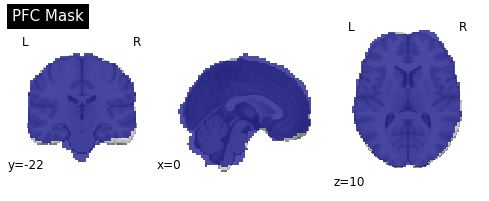

sub: 122 task: trust run: 2


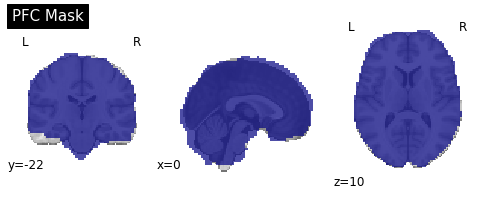

sub: 122 task: trust run: 4


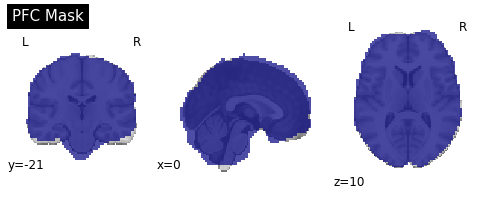

sub: 122 task: trust run: 1


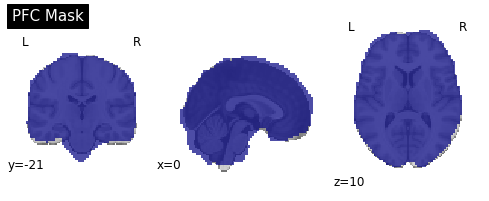

sub: 129 task: trust run: 3


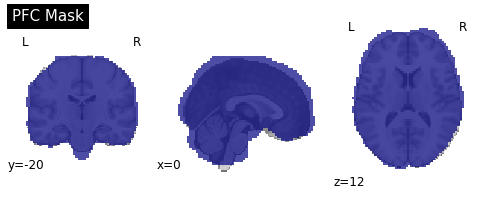

sub: 129 task: trust run: 1


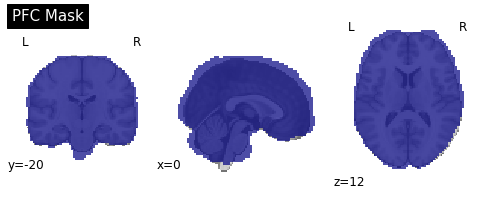

sub: 129 task: trust run: 2


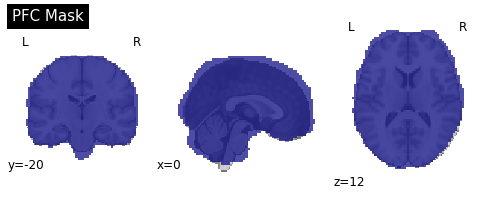

sub: 129 task: trust run: 4


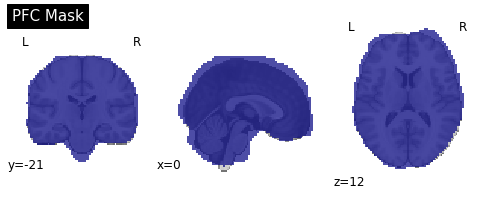

sub: 129 task: trust run: 5


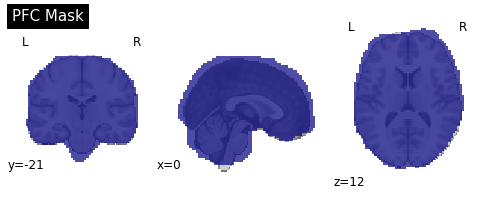

sub: 137 task: trust run: 3


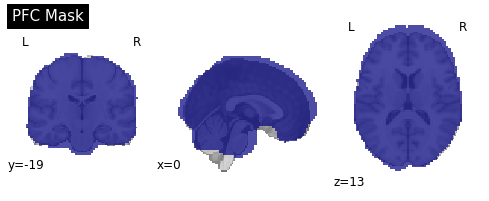

sub: 137 task: trust run: 5


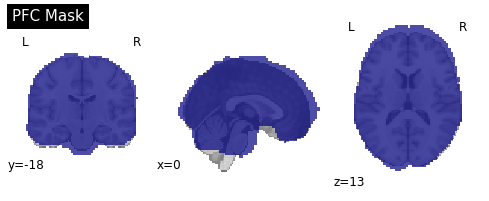

sub: 137 task: trust run: 1


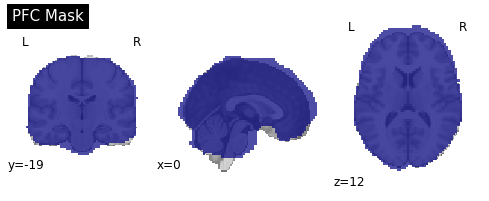

sub: 137 task: trust run: 4


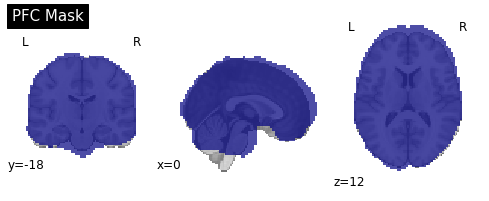

sub: 137 task: trust run: 2


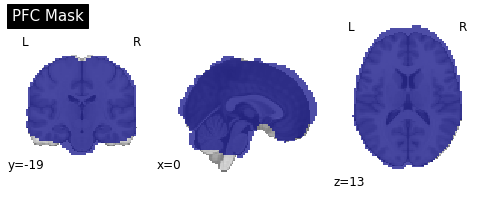

sub: 104 task: trust run: 4


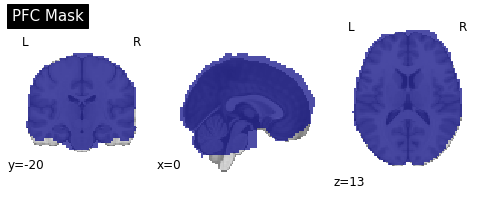

sub: 104 task: trust run: 2


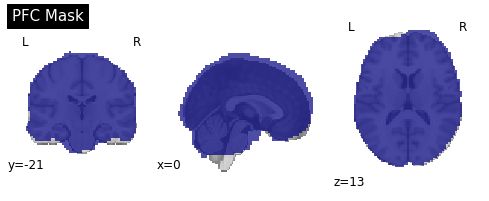

sub: 104 task: trust run: 3


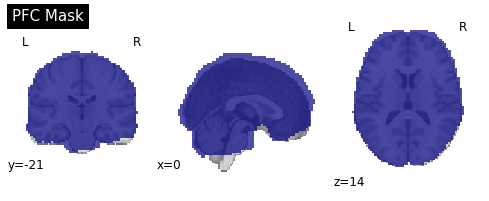

sub: 104 task: trust run: 5


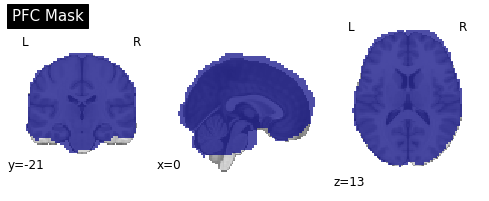

sub: 104 task: trust run: 1


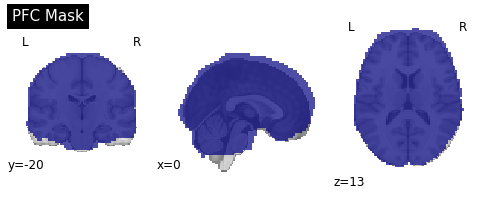

sub: 144 task: trust run: 1


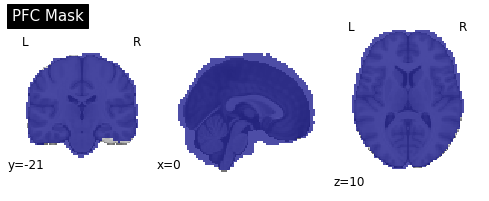

sub: 144 task: trust run: 2


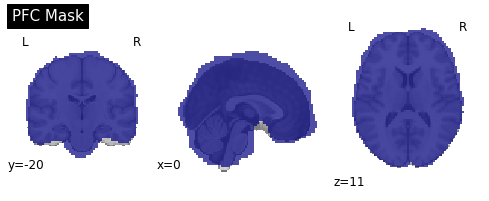

sub: 110 task: trust run: 1


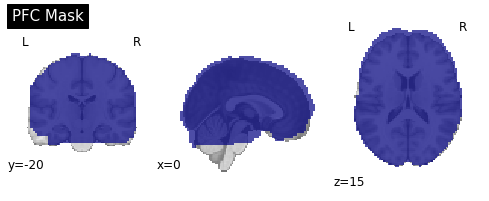

sub: 110 task: trust run: 2


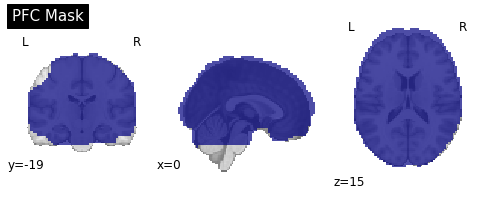

sub: 135 task: ultimatum run: 1


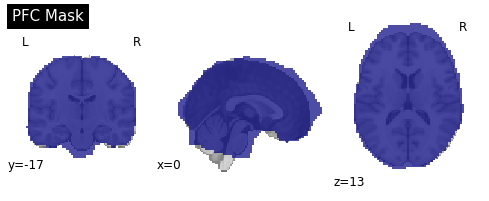

sub: 135 task: ultimatum run: 2


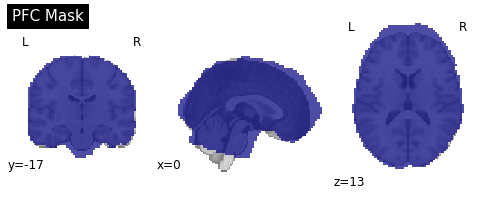

sub: 158 task: ultimatum run: 1


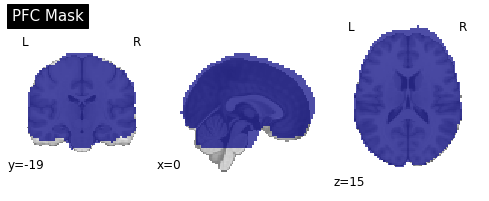

sub: 158 task: ultimatum run: 2


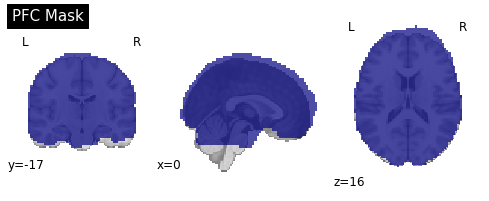

sub: 118 task: ultimatum run: 2


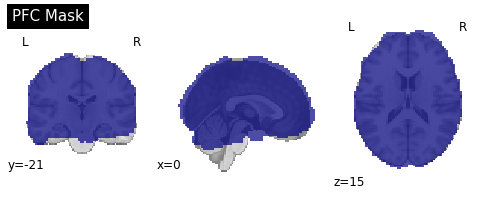

sub: 118 task: ultimatum run: 1


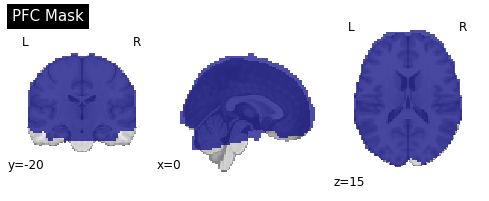

sub: 154 task: ultimatum run: 2


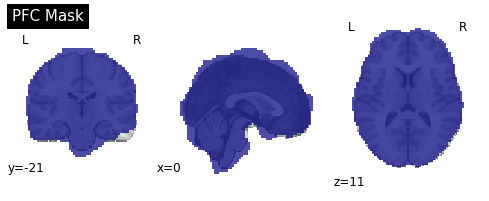

sub: 154 task: ultimatum run: 1


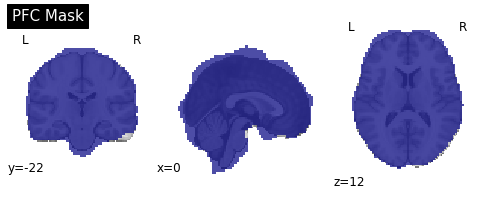

sub: 107 task: ultimatum run: 2


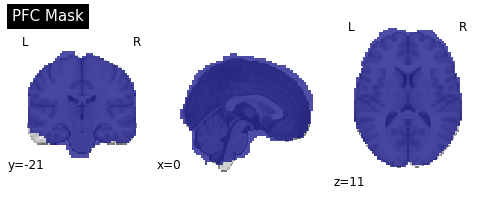

sub: 107 task: ultimatum run: 1


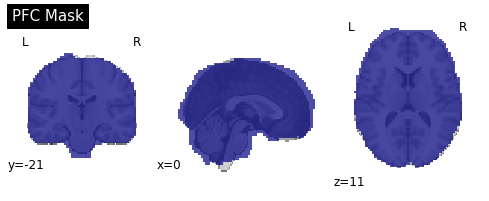

sub: 142 task: ultimatum run: 1


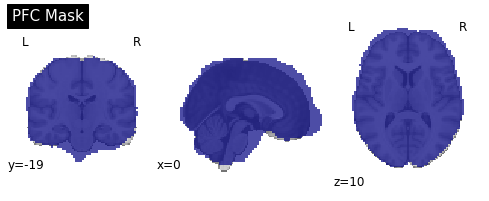

sub: 142 task: ultimatum run: 2


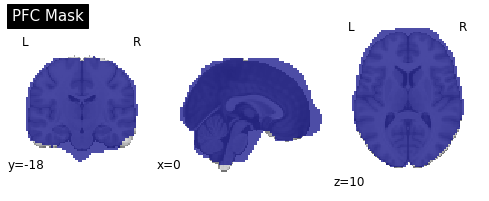

sub: 113 task: ultimatum run: 2


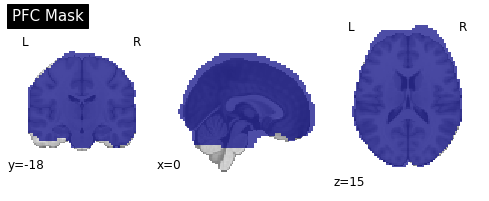

sub: 113 task: ultimatum run: 1


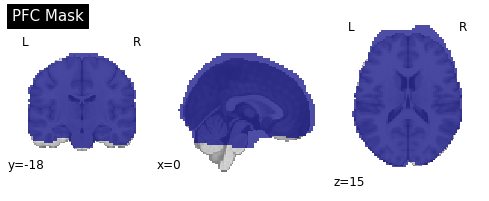

sub: 159 task: ultimatum run: 2


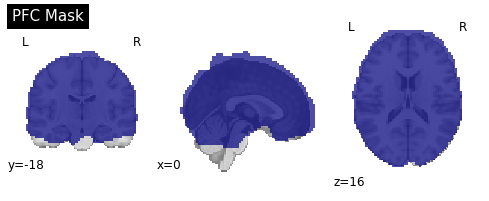

sub: 159 task: ultimatum run: 1


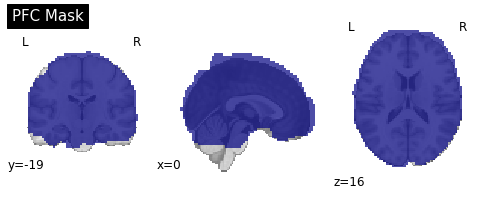

sub: 152 task: ultimatum run: 2


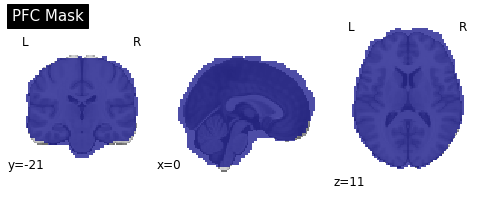

sub: 152 task: ultimatum run: 1


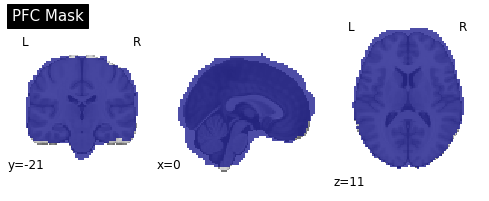

sub: 106 task: ultimatum run: 2


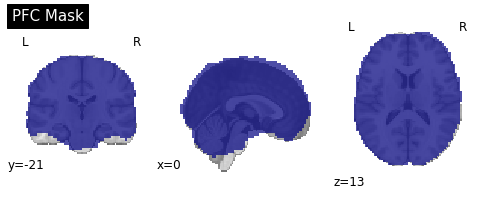

sub: 106 task: ultimatum run: 1


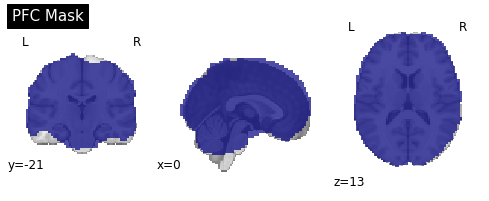

sub: 132 task: ultimatum run: 1


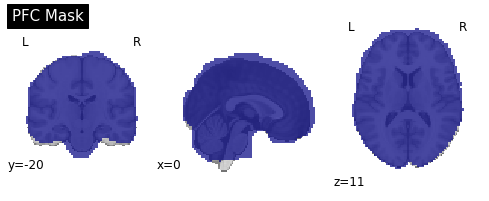

sub: 132 task: ultimatum run: 2


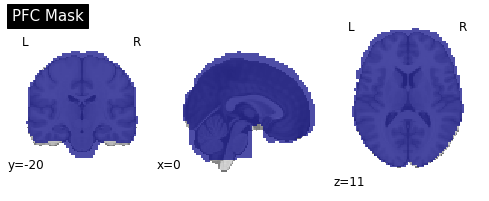

sub: 112 task: ultimatum run: 1


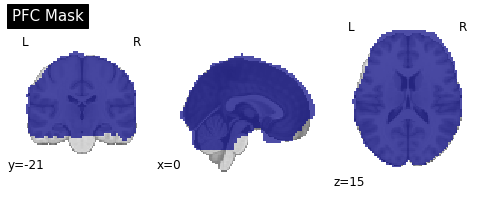

sub: 112 task: ultimatum run: 2


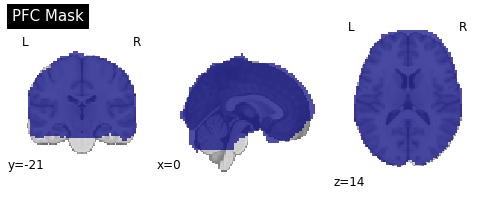

sub: 134 task: ultimatum run: 1


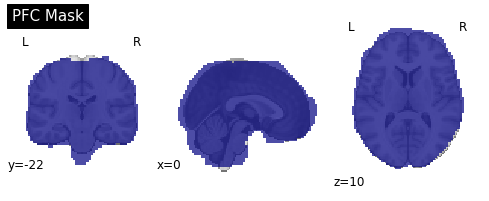

sub: 134 task: ultimatum run: 2


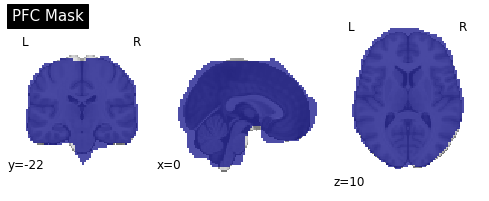

sub: 140 task: ultimatum run: 2


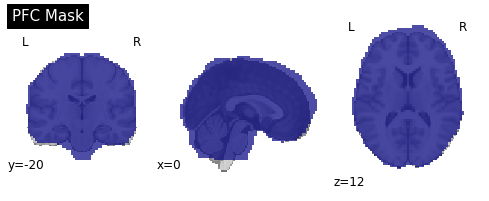

sub: 140 task: ultimatum run: 1


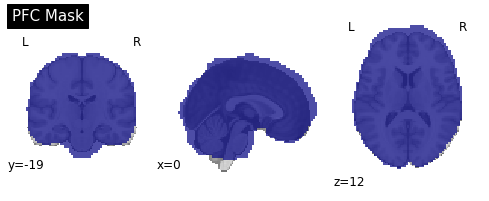

sub: 153 task: ultimatum run: 1


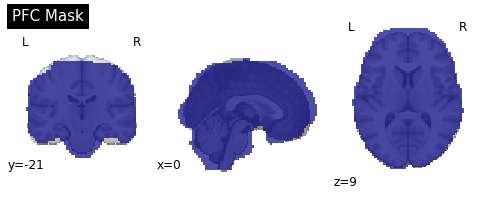

sub: 153 task: ultimatum run: 2


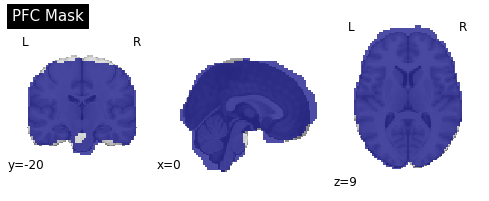

sub: 131 task: ultimatum run: 1


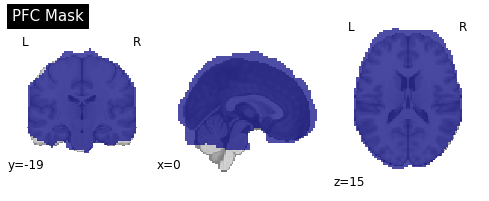

sub: 131 task: ultimatum run: 2


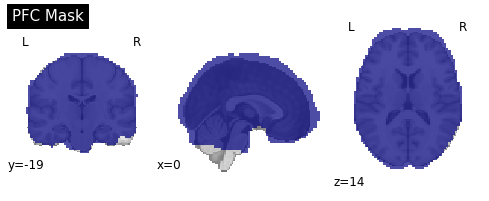

sub: 125 task: ultimatum run: 1


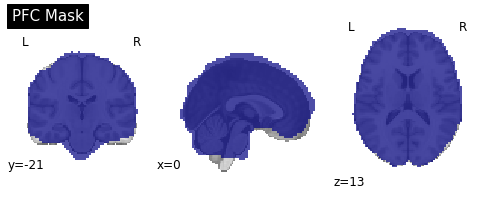

sub: 125 task: ultimatum run: 2


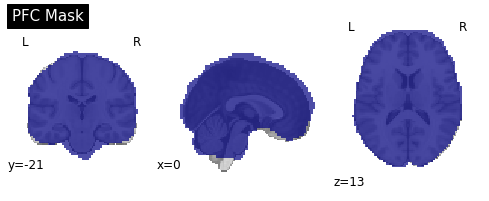

sub: 151 task: ultimatum run: 1


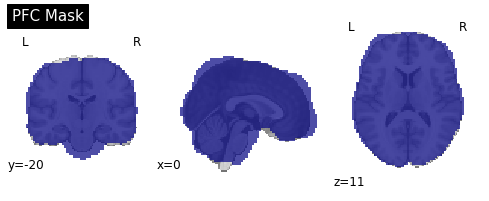

sub: 151 task: ultimatum run: 2


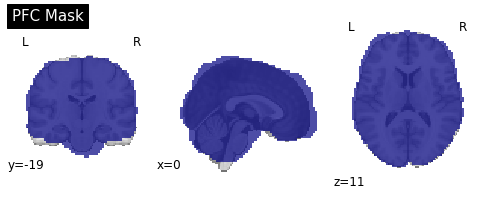

sub: 136 task: ultimatum run: 1


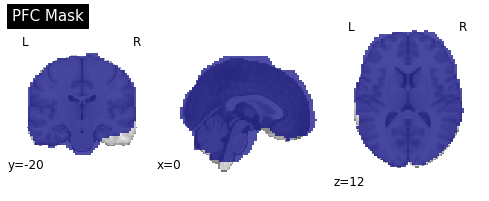

sub: 136 task: ultimatum run: 2


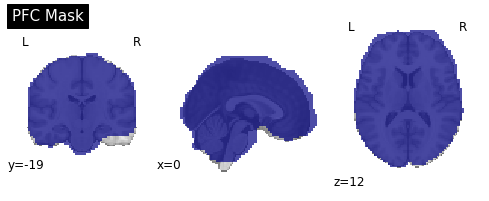

sub: 145 task: ultimatum run: 1


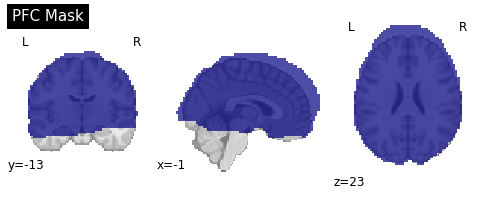

sub: 145 task: ultimatum run: 2


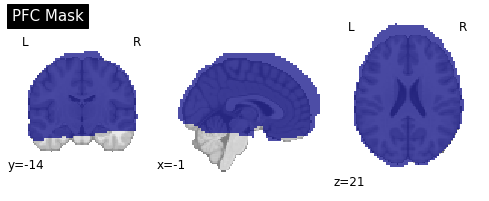

sub: 147 task: ultimatum run: 2


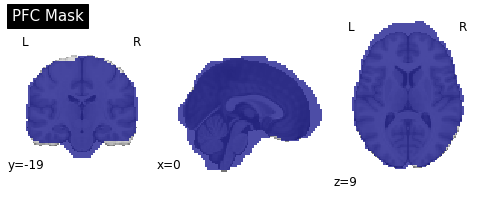

sub: 147 task: ultimatum run: 1


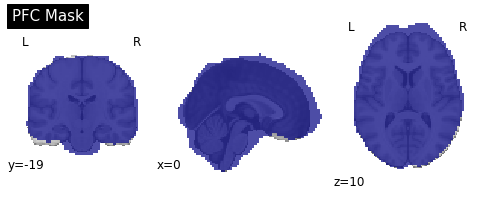

sub: 105 task: ultimatum run: 1


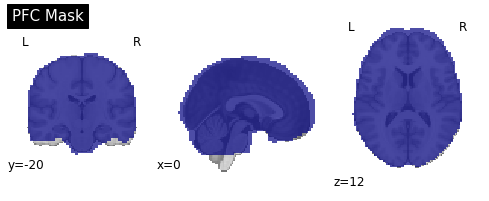

sub: 105 task: ultimatum run: 2


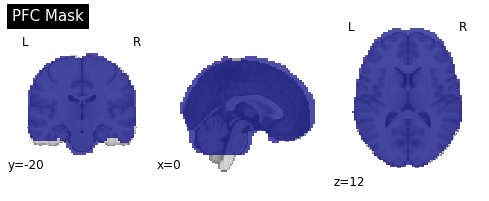

sub: 108 task: ultimatum run: 1


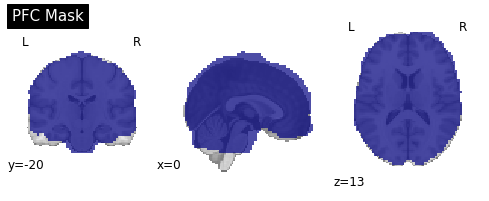

sub: 108 task: ultimatum run: 2


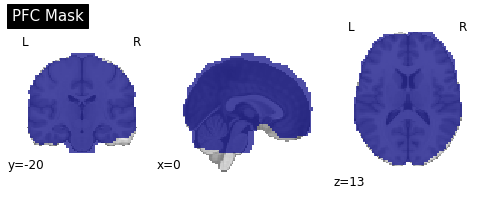

sub: 156 task: ultimatum run: 2


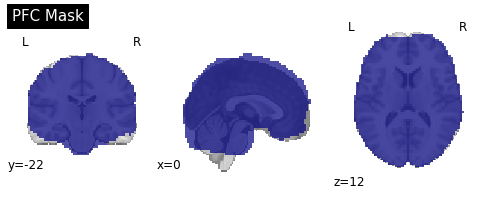

sub: 156 task: ultimatum run: 1


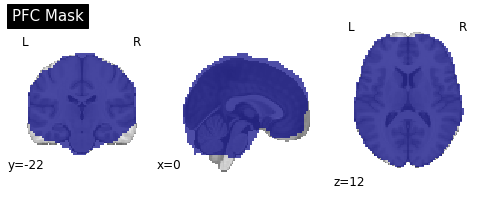

sub: 157 task: ultimatum run: 1


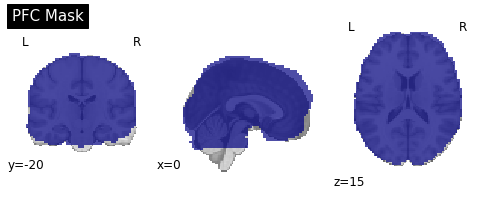

sub: 157 task: ultimatum run: 2


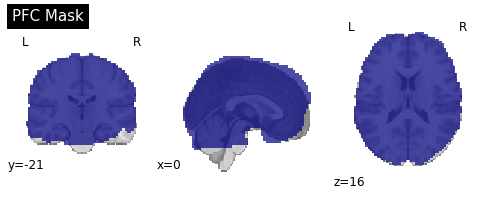

sub: 111 task: ultimatum run: 1


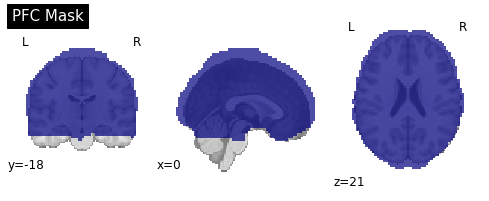

sub: 111 task: ultimatum run: 2


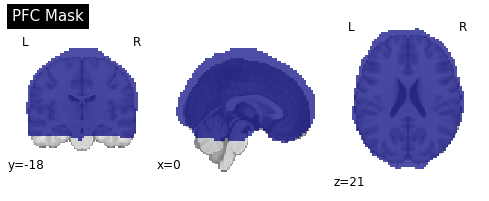

sub: 128 task: ultimatum run: 1


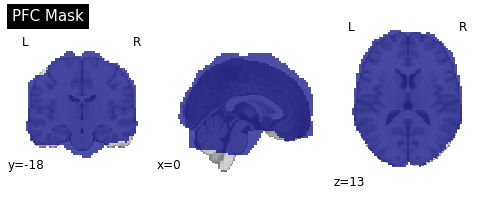

sub: 128 task: ultimatum run: 2


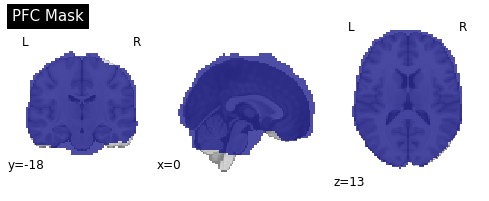

sub: 127 task: ultimatum run: 2


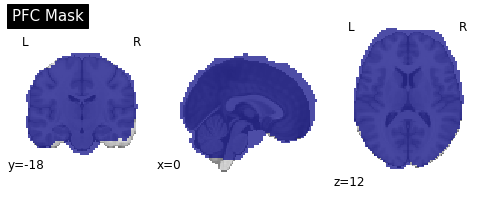

sub: 127 task: ultimatum run: 1


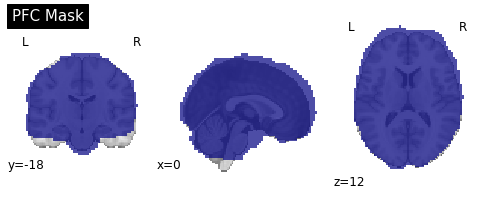

sub: 115 task: ultimatum run: 1


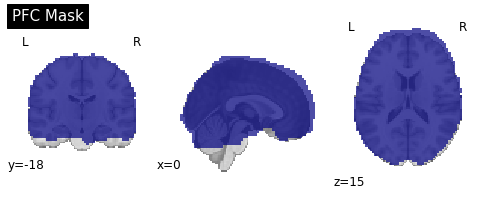

sub: 115 task: ultimatum run: 2


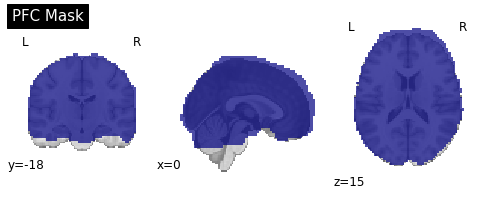

sub: 117 task: ultimatum run: 2


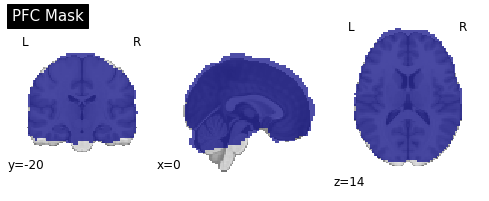

sub: 117 task: ultimatum run: 1


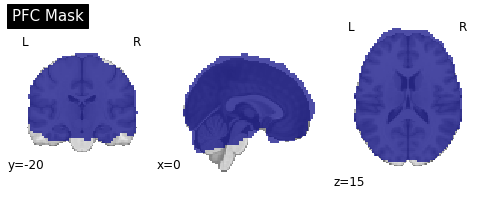

sub: 150 task: ultimatum run: 2


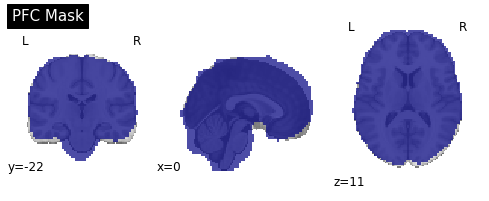

sub: 150 task: ultimatum run: 1


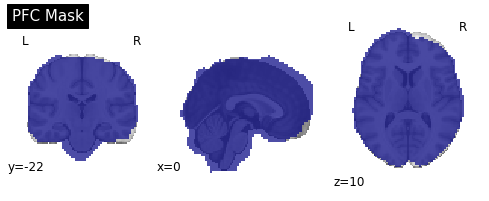

sub: 120 task: ultimatum run: 1


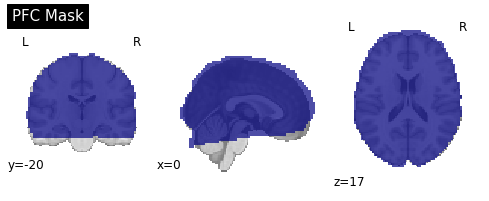

sub: 120 task: ultimatum run: 2


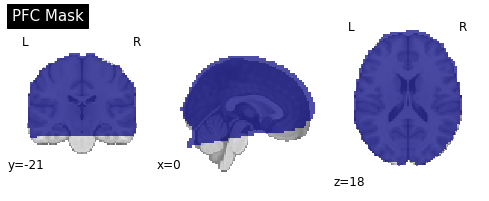

sub: 116 task: ultimatum run: 1


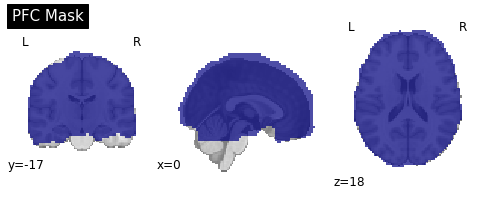

sub: 116 task: ultimatum run: 2


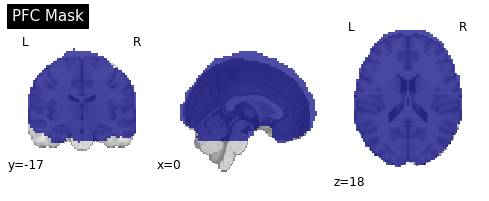

sub: 141 task: ultimatum run: 1


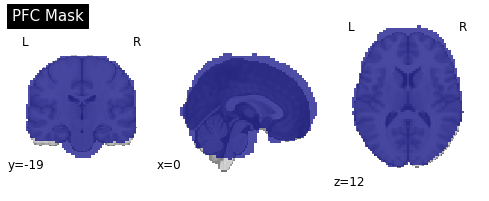

sub: 141 task: ultimatum run: 2


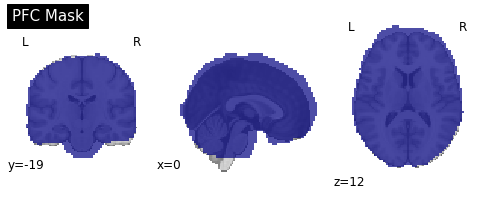

sub: 138 task: ultimatum run: 1


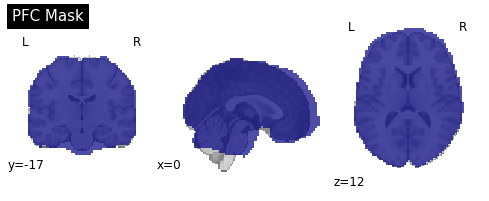

sub: 138 task: ultimatum run: 2


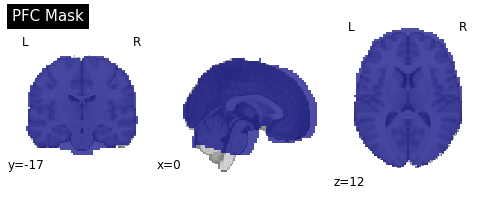

sub: 143 task: ultimatum run: 1


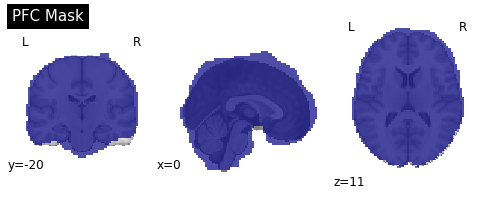

sub: 143 task: ultimatum run: 2


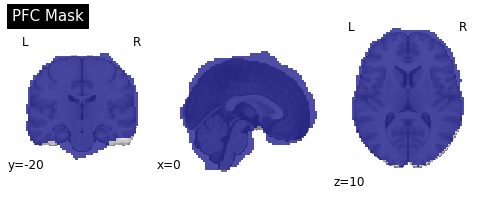

sub: 124 task: ultimatum run: 1


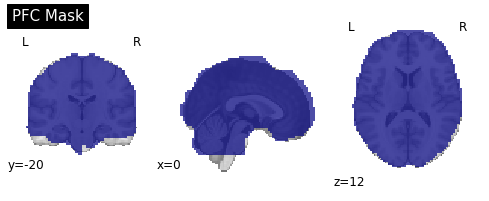

sub: 124 task: ultimatum run: 2


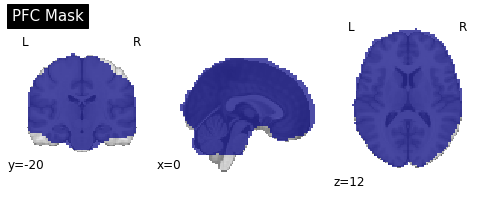

sub: 126 task: ultimatum run: 2


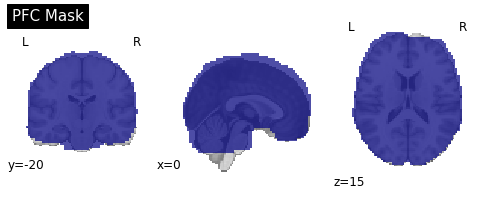

sub: 126 task: ultimatum run: 1


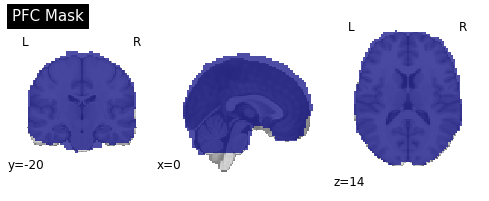

sub: 155 task: ultimatum run: 2


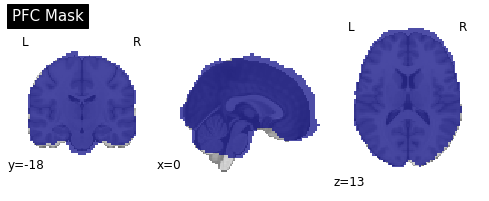

sub: 155 task: ultimatum run: 1


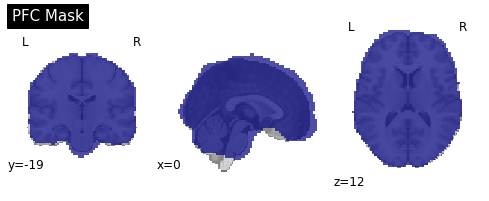

sub: 109 task: ultimatum run: 2


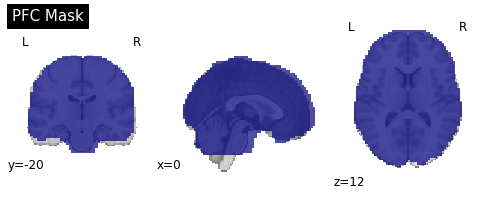

sub: 109 task: ultimatum run: 1


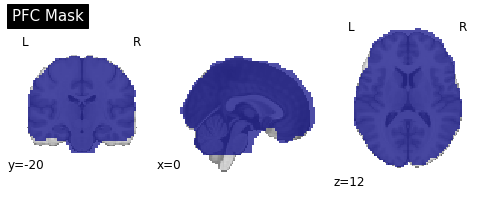

sub: 133 task: ultimatum run: 2


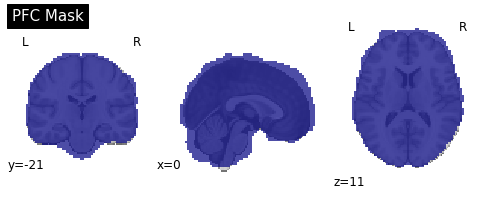

sub: 133 task: ultimatum run: 1


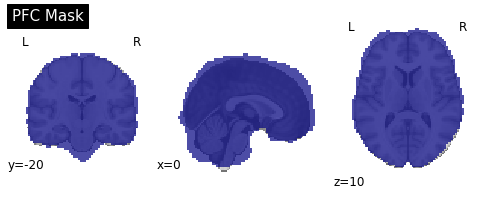

sub: 149 task: ultimatum run: 1


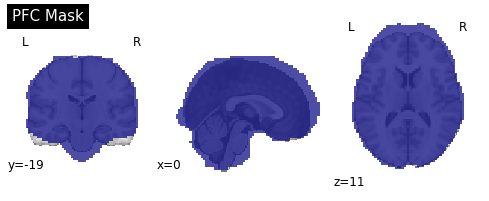

sub: 149 task: ultimatum run: 2


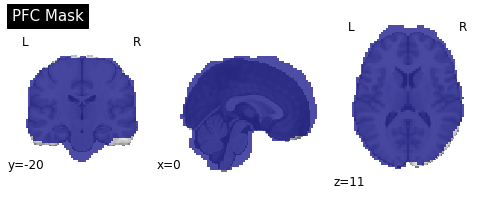

sub: 130 task: ultimatum run: 1


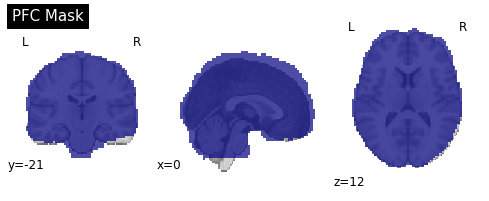

sub: 130 task: ultimatum run: 2


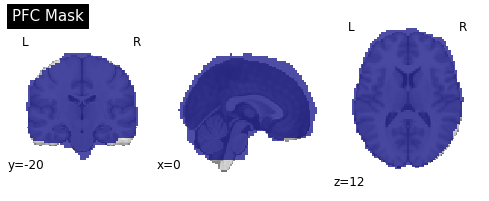

sub: 121 task: ultimatum run: 1


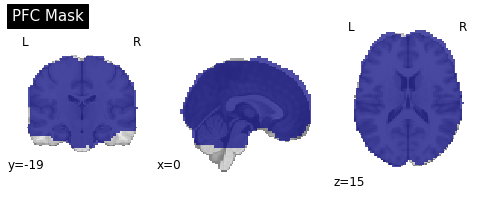

sub: 121 task: ultimatum run: 2


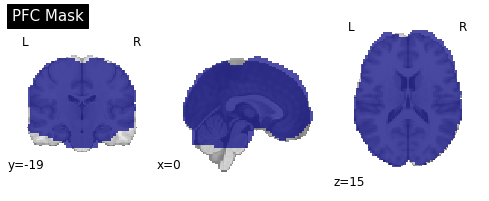

sub: 122 task: ultimatum run: 2


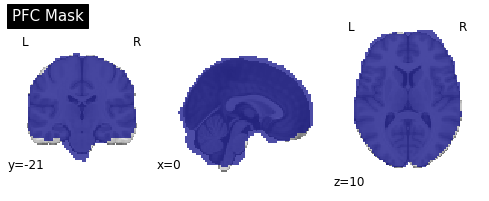

sub: 122 task: ultimatum run: 1


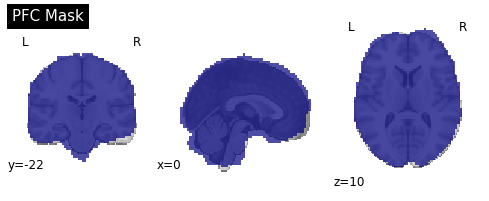

sub: 129 task: ultimatum run: 2


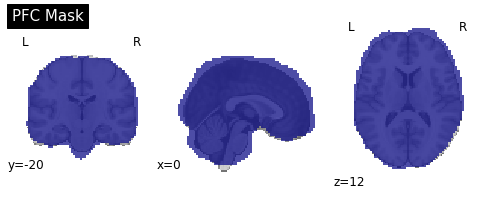

sub: 129 task: ultimatum run: 1


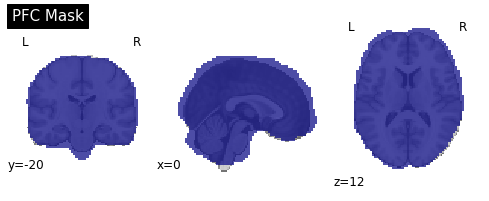

sub: 137 task: ultimatum run: 2


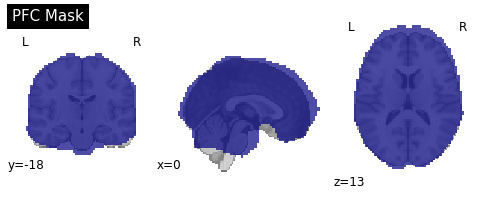

sub: 137 task: ultimatum run: 1


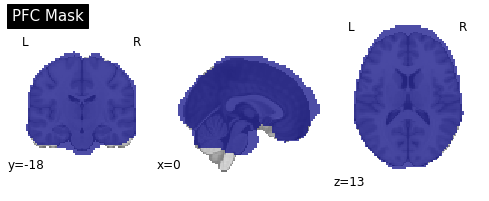

sub: 104 task: ultimatum run: 1


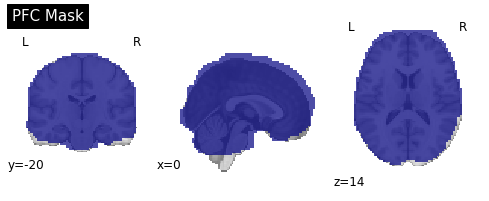

sub: 104 task: ultimatum run: 2


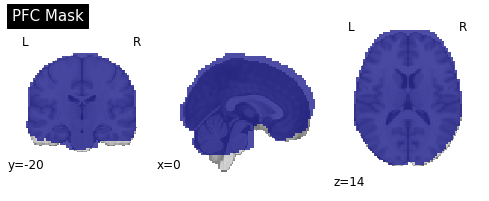

sub: 144 task: ultimatum run: 2


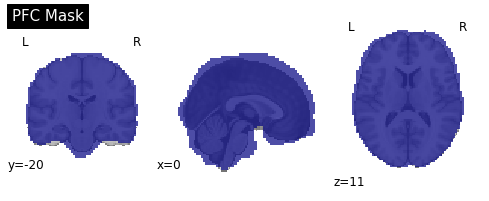

sub: 144 task: ultimatum run: 1


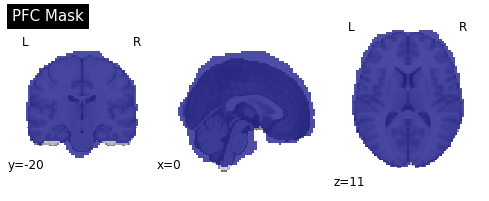

sub: 110 task: ultimatum run: 1


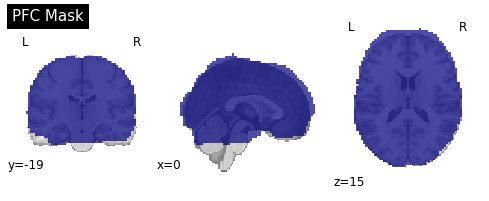

sub: 110 task: ultimatum run: 2


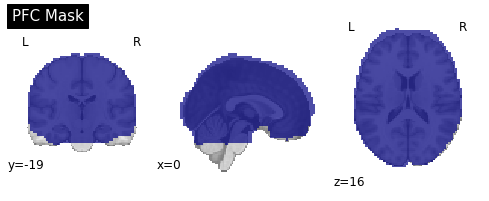

In [7]:
from nilearn.image import math_img
import nibabel as nib
data=[]
img_data=[]
for task in ['sharedreward','trust','ultimatum']:
    img_list=[img for img in f_list if task in img]
    
    for img in img_list:
        sub=re.search('func/sub-(.*?)_task',img).group(1)
        task=re.search('_task-(.*)_run',img).group(1)
        run=re.search('_run-(.*)_space',img).group(1)
        print('sub: %s task: %s run: %s'%(sub,task,run))
        mask = '../derivatives/fmriprep/sub-%s/func/sub-%s_task-%s_run-%s_space-MNI152NLin2009cAsym_desc-brain_mask.nii.gz'%(sub,sub,task,run)
        plotting.plot_roi(mask,title="fmriprep Mask", draw_cross=False)
        plt.show()

        nifti_masker = NiftiMasker(mask_img=mask)
        x=nifti_masker.fit_transform(img)
        img=nifti_masker.inverse_transform(x)
        
        tsnr_img = image.math_img('img.mean(axis=3) / img.std(axis=3)', img=img)
        nib.save(tsnr_img,'../derivatives/tsnr/sub-%s_task-%s_run-%s_tsnr.nii.gz'%(sub,task,run))
        img_data.append([tsnr_img,task,run,sub])


In [14]:
df=pd.DataFrame(data=img_data,columns=['img','task','run','sub'])
for task in ['sharedreward','trust','ultimatum']:
    img_list=df[df['task']==task]['img'].to_list()
    img=img.mean_img(img_list)
    nib.save(img,'../derivatives/tsnr/Mean-tsnr_task-%s.nii.gz'%(sub,task,run))

AttributeError: 'Nifti1Image' object has no attribute 'mean_img'

,sub,MB,ME,Region,TSNR
0,10041,6,1,Striatum,23.308727
1,10041,3,1,Striatum,23.511727
2,10041,3,4,Striatum,37.620564
3,10041,1,1,Striatum,28.178135
4,10041,6,4,Striatum,34.180344


<AxesSubplot:xlabel='MB', ylabel='TSNR'>

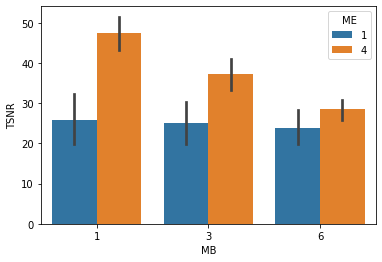

In [5]:

df=pd.DataFrame(data=data,columns=['sub','MB','ME','Striatum','MPFC'])
df=df.melt(id_vars=['sub','MB','ME'],var_name='Region',value_name='TSNR')
display(df.head())
plt_df=df[df['Region']=='Striatum']

sns.barplot(x='MB',y='TSNR',hue='ME',data=plt_df)


def collect_tsnr(img):
    start = time.time()

    me=int(re.search('_acq-mb[0-7]me(.*?)_',img).group(1))
    mb=int(re.search('_acq-mb(.*?)me',img).group(1))
    sub=re.search('func/sub-(.*?)_task',img).group(1)
    print(sub,mb,me)
    #mask = re.sub("desc-(.*?).nii.gz","desc-brain_mask.nii.gz",img)
    
    nifti_masker = NiftiMasker(mask_strategy='background')
    x=nifti_masker.fit_transform(img)
    img=nifti_masker.inverse_transform(x)
    end = time.time()
    print("first maskfit:",end - start)
    print(img.shape)
    
    
    # calculate mean image for the background
    from nilearn.image import math_img
    tsnr_img = image.math_img('img.mean(axis=3) / img.std(axis=3)', img=img)
    img_list=[tsnr_img,me,mb,sub]
    y=str_mask.fit_transform(tsnr_img)
    print("STR maskfit:",end - start)
    z=cort_mask.fit_transform(tsnr_img)
    print("CORT maskfit:",end - start)
    data_row=[sub,mb,me,np.mean(np.abs(x.flatten())),
                 np.mean(np.abs(y.flatten())),
                 np.mean(np.abs(z.flatten()))]
    return([img_list,data_row])

    end = time.time()
    print(end - start)

def driver_func(myfunc,input_list):
    THREADS=10
    with multiprocessing.Pool(THREADS) as pool:
        results=pool.map(myfunc,input_list)
    return(results)
data=driver_func(collect_tsnr,f_list)

for img in img_list:
    plotting.plot_stat_map(img[0],
                      title="tsnr for Sub: %s ME: %s MB: %s "%(img[3],img[1],img[2]),
                      vmax=200,draw_cross=False)
    plt.show()


## Plot tsnr Maps

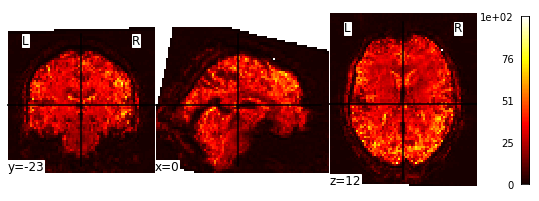

In [6]:
img=f_list[0]

#nifti_masker = NiftiMasker(mask_strategy='epi')
#x=nifti_masker.fit_transform(img)
#img=nifti_masker.inverse_transform(x)
tsnr_img = image.math_img('img.mean(axis=3) / img.std(axis=3)', img=img)
plotting.plot_stat_map(tsnr_img)

[[<nibabel.nifti1.Nifti1Image at 0x7fdd8becb9a0>, 4, 3, '10017'],
 [<nibabel.nifti1.Nifti1Image at 0x7fdd8becbb50>, 4, 1, '10017'],
 [<nibabel.nifti1.Nifti1Image at 0x7fdd8becb580>, 1, 1, '10017'],
 [<nibabel.nifti1.Nifti1Image at 0x7fdd8bdb65e0>, 1, 3, '10017'],
 [<nibabel.nifti1.Nifti1Image at 0x7fdd8bdb67f0>, 4, 6, '10017'],
 [<nibabel.nifti1.Nifti1Image at 0x7fdd8bdb6d90>, 1, 6, '10017']]

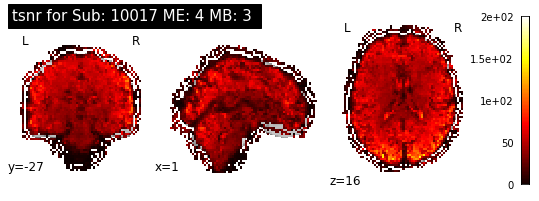

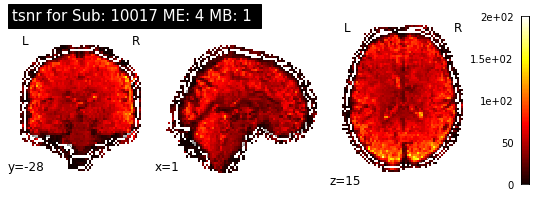

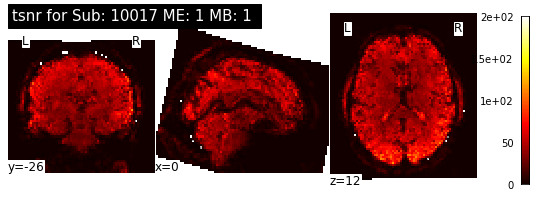

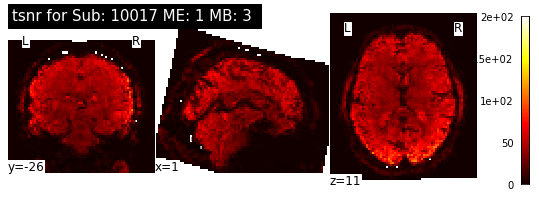

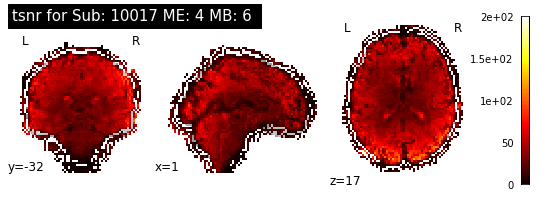

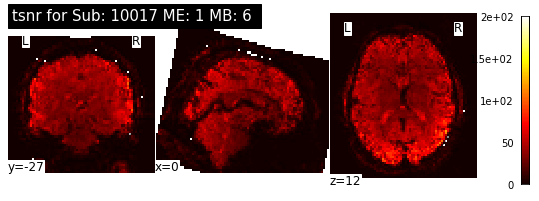

In [7]:
sub='10017'
sub_list=[img for img in img_list if img[3]==sub]
display(sub_list)
for img in sub_list:
    plotting.plot_stat_map(img[0],title="tsnr for Sub: %s ME: %s MB: %s "%(img[3],img[1],img[2]),vmax=200,draw_cross=False)
    plt.show()

# L1 Z-stats
- Heads up these Graphs are interactive

In [8]:
f_list = [os.path.join(root,f) for root,dirs,files in os.walk(
    '../derivatives/fsl/') for f in files if ('zstat' in f) & f.endswith('.nii.gz')]#  ('stats' in root) &if ('/stats/zstat' in f) & (f.endswith('nii.gz'))]
f_list=[f for f in f_list if ('stats/zstat' in f) & ('L1_task' in f)]
display(f_list)

['../derivatives/fsl/sub-10041/L1_task-sharedreward_model-1_type-act_acq-mb6me1_sm-4.feat/stats/zstat2.nii.gz',
 '../derivatives/fsl/sub-10041/L1_task-sharedreward_model-1_type-act_acq-mb6me1_sm-4.feat/stats/zstat14.nii.gz',
 '../derivatives/fsl/sub-10041/L1_task-sharedreward_model-1_type-act_acq-mb6me1_sm-4.feat/stats/zstat9.nii.gz',
 '../derivatives/fsl/sub-10041/L1_task-sharedreward_model-1_type-act_acq-mb6me1_sm-4.feat/stats/zstat16.nii.gz',
 '../derivatives/fsl/sub-10041/L1_task-sharedreward_model-1_type-act_acq-mb6me1_sm-4.feat/stats/zstat11.nii.gz',
 '../derivatives/fsl/sub-10041/L1_task-sharedreward_model-1_type-act_acq-mb6me1_sm-4.feat/stats/zstat8.nii.gz',
 '../derivatives/fsl/sub-10041/L1_task-sharedreward_model-1_type-act_acq-mb6me1_sm-4.feat/stats/zstat10.nii.gz',
 '../derivatives/fsl/sub-10041/L1_task-sharedreward_model-1_type-act_acq-mb6me1_sm-4.feat/stats/zstat15.nii.gz',
 '../derivatives/fsl/sub-10041/L1_task-sharedreward_model-1_type-act_acq-mb6me1_sm-4.feat/stats/zst

In [9]:

def collect_zstats(img):
    zstat=int(re.search('thresh_zstat(.*).nii.gz',img).group(1))
    if zstat>10:
        me=int(re.search('_acq-mb[0-7]me(.*?)_',img).group(1))
        mb=int(re.search('_acq-mb(.*?)me',img).group(1))
        sub=re.search('fsl/sub-(.*?)/L1',img).group(1)
        mask = re.sub("desc-(.*?).nii.gz","desc-brain_mask.nii.gz",img)

        nifti_masker = NiftiMasker(mask_strategy='background')
        x=nifti_masker.fit_transform(img)
        img=nifti_masker.inverse_transform(x)

        # calculate mean image for the background
    
        x=nifti_masker.fit_transform(img)
        y=str_mask.fit_transform(img)
        z=cort_mask.fit_transform(img)
        
        img_row=[str_mask.inverse_transform(y),img,zstat,me,mb,sub]

        data_row=[sub,mb,me,zstat,np.mean(np.abs(x.flatten())),
                     np.mean(np.abs(y.flatten())),
                     np.mean(np.abs(z.flatten()))]
        return(data_row)

def driver_func(myfunc,input_list):
    THREADS=4
    with multiprocessing.Pool(THREADS) as pool:
        data_res=[pool.apply_async(myfunc,p) for p in input_list]
        
driver_func(collect_zstats,f_list)

In [10]:
data=[]
img_list=[]
for img in f_list:
    
    zstat=int(re.search('zstat(.*).nii.gz',img).group(1))
    if zstat in[5,7,8,9]:
        me=int(re.search('_acq-mb[0-7]me(.*?)_',img).group(1))
        mb=int(re.search('_acq-mb(.*?)me',img).group(1))
        sub=re.search('fsl/sub-(.*?)/L1',img).group(1)
        #mask = re.sub("desc-(.*?).nii.gz","desc-brain_mask.nii.gz",img)

        #nifti_masker = NiftiMasker(mask_strategy='background')
        x=cort_mask.fit_transform(img)
        img=cort_mask.inverse_transform(x)

        # calculate mean image for the background
    
        #x=nifti_masker.fit_transform(img)
        #y=str_mask.fit_transform(img)
        z=cort_mask.fit_transform(img)
        
        #img_list.append([str_mask.inverse_transform(y),img,zstat,me,mb,sub])

        data.append([sub,mb,me,zstat,np.mean(z.flatten())])

,sub,acq,Reward,contrast,MB,ME,zstat
0,10017,11,Punishment,5.166667,1.0,1.0,-0.034345
1,10017,11,Reward,8.000000,1.0,1.0,-0.026398
2,10017,14,Punishment,6.500000,1.0,4.0,0.013210
3,10017,14,Reward,8.000000,1.0,4.0,0.027458
4,10017,31,Punishment,6.500000,3.0,1.0,0.323935


,sub,acq,Reward,contrast,MB,ME,zstat
0,10017,11,Punishment,5.166667,1.0,1.0,-0.034345
1,10017,11,Reward,8.000000,1.0,1.0,-0.026398
2,10017,14,Punishment,6.500000,1.0,4.0,0.013210
3,10017,14,Reward,8.000000,1.0,4.0,0.027458
4,10017,31,Punishment,6.500000,3.0,1.0,0.323935


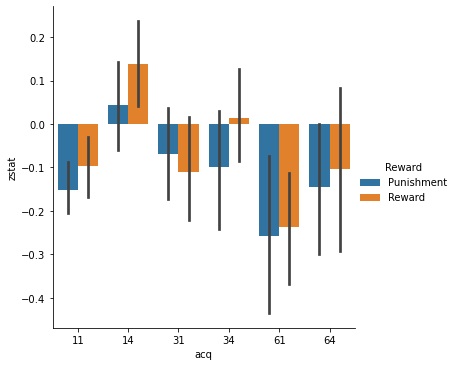

In [11]:
df=pd.DataFrame(data=data,columns=['sub','MB','ME','contrast','Striatum'])
df=df.melt(id_vars=['contrast','sub','MB','ME'],var_name='Region',value_name='zstat')
df['acq']=df["MB"].astype(str) + df["ME"].astype(str)
df['condition'] = df['contrast'].replace({5:'Computer Punishment',
                                          7:'Computer Reward',
                                          8:'Stranger Punishment',
                                          9:'Stranger Reward'})
df=df[~df['sub'].isin(['10041','10069','10085','10094'])]
df[['Player','Reward']] = df.condition.str.split(expand=True)
plt_df=df[df['Region']=='Striatum']

plt_df=df.groupby(by=['sub','acq','Reward']).mean().reset_index()

display(plt_df.head())
g=sns.catplot(x='acq',y='zstat',hue='Reward',kind='bar',data=plt_df,ci=85,
              dodge=True,order=['11','14','31','34','61','64'])
g.savefig('RF1-zstat.pdf')
plt_df.head()

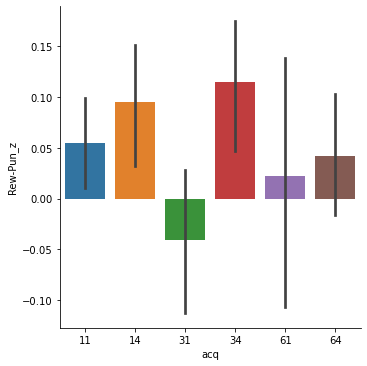

,index,sub,acq,Reward,contrast,MB,ME,zstat,Rew-Pun_z
0,1,10017,11,Reward,8.0,1.0,1.0,-0.026398,0.007947
1,3,10017,14,Reward,8.0,1.0,4.0,0.027458,0.014248
2,5,10017,31,Reward,8.0,3.0,1.0,0.421100,0.097165
3,7,10017,34,Reward,8.0,3.0,4.0,0.105164,-0.122832
4,9,10017,61,Reward,8.0,6.0,1.0,-0.494141,-0.071282


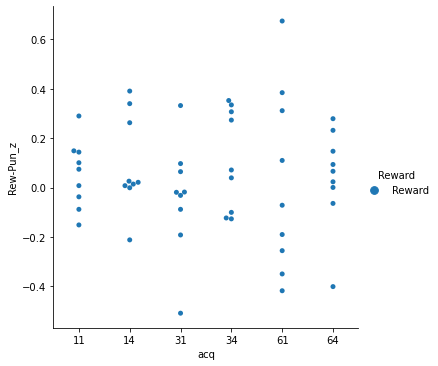

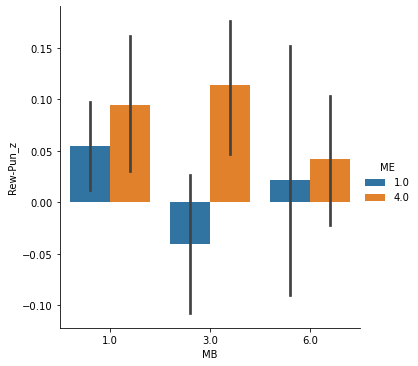

In [19]:
rew=plt_df[plt_df['Reward']=='Reward'].reset_index()
pun=plt_df[plt_df['Reward']=='Punishment'].reset_index()
rew['Rew-Pun_z']=rew['zstat']-pun['zstat']

g=sns.catplot(x='acq',y='Rew-Pun_z',kind='bar',data=rew,ci=68,
              dodge=True,order=['11','14','31','34','61','64'])
plt.show()
sns.catplot(x='acq',y='Rew-Pun_z',hue='Reward',kind='swarm',data=rew,dodge=True,
            order=['11','14','31','34','61','64'])

#equiv = {11:1, 14:1, 31:3, 34:3,61:6,64:6}
#rew["Band Factor"] = rew["acq"].map(equiv)
#equiv = {11:1, 14:4, 31:1, 34:4,61:1,64:4}
#rew["Echo Factor"] = rew["acq"].map(equiv)
display(rew.head())

g=sns.catplot(x='MB',y='Rew-Pun_z',kind='bar', hue='ME',data=rew,ci=68,)
plt.show()

<AxesSubplot:xlabel='None-MB-ME-Rew-Pun_z'>

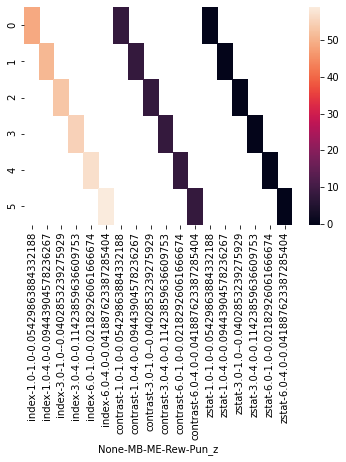

In [13]:
pivot=rew.groupby(by=['MB','ME']).mean().reset_index()
pivot=pivot.pivot(columns=['MB','ME','Rew-Pun_z'])
sns.heatmap(pivot)